# What drives the churn rate of a Databel internet service provider?


**OVERVIEW**

In this application, we will explore a dataset from [Kaggle](https://www.kaggle.com/datasets/yichienchong/databel-telecom-customer-churn-dataset/data). The original dataset contains information on more than six thousand customers spread across all fifty-one states in the US. Our goal is to understand the factors that lead Databel internet service provider customers to stop their service, particularly focusing on the recent rise in the customer churn rate. As a result of our analysis, I will provide clear recommendations to our client—the board of Databel—regarding the reasons for the increase in churn rate. I will use the CRISP-DM framework to try to answer this question.


# CRISP-DM Framework

To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  A brief overview of CRISP-DM is [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  

In [4]:
# https://github.com/ahachani/Final_Capstone_Chap24

## Business Understanding

From a business perspective, we are tasked with identifying key drivers for the churn rate of a Databel internet service provider.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary:

In [6]:
# business undrestanding of the Churn issue

In this application, we will explore a dataset from Kaggle. The original dataset contains information on more than six thousand customers spread across all fifty-one states in the US. Our goal is to understand the factors that lead Databel internet service provider customers to stop their service, particularly focusing on the recent rise in the customer churn rate (use of the column 'Churn Label'). As a result of our analysis, we should provide clear recommendations to our client—the board of Databel—regarding the reasons for the increase in churn rate.

To achieve this, we will:

1. **Data Cleaning and Preprocessing:** We will ensure the dataset is clean, consistent, and ready for analysis by handling missing values, encoding categorical variables, and normalizing numerical features.
2. **Exploratory Data Analysis (EDA):** We will perform a detailed exploratory analysis to identify patterns and trends within the data. Visualize key metrics and customer demographics to understand the overall customer base.
3. **Feature Engineering:** We will create new features that might help in predicting churn, based on existing data. This might include interaction terms, customer tenure, and usage patterns.
4. **Model Building:** We will use machine learning algorithms to build predictive models that identify customers at risk of churning. Also, I will  evaluate various models to determine the best performing one.
5. **Model Evaluation:** We will assess the models using appropriate metrics such as accuracy, precision, recall, and F1-score. We will ensure the model is reliable and generalizes well to unseen data.
6. **Interpretation of Results:** we will Analyze the model results to identify the most significant factors contributing to customer churn. We will use this insight to draw meaningful conclusions.
7. **Recommendations:** Based on the findings, we will provide actionable recommendations to the board of Databel. These should be aimed at reducing churn, improving customer retention, and addressing the specific issues identified during the analysis.

By following these steps, we aim to provide Databel with a comprehensive understanding of the factors driving customer churn and offer strategic recommendations to mitigate this issue.


## Data Understanding

After considering the business understanding, we want to get familiar with our data.  We will write down some steps that we would take to get to know the dataset and identify any quality issues within.  It will Take time to get to know the dataset and explore what information it contains and how this could be used to inform our business understanding.

In [233]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from time import time

from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import category_encoders as ce
from imblearn.over_sampling import SMOTE


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.metrics import classification_report, roc_auc_score, confusion_matrix
from sklearn.metrics import classification_report
warnings.filterwarnings('ignore')

In [10]:
data = pd.read_csv('data/Databel - Data.csv')

In [12]:
# Check the cleaned dataset
data.head()

,Customer ID,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,...,Senior,Group,Number of Customers in Group,Device Protection & Online Backup,Contract Type,Payment Method,Monthly Charge,Total Charges,Churn Category,Churn Reason
0,4444-BZPU,No,1,3,8.0,0.0,0.0,No,no,0.0,...,No,No,0,No,Month-to-Month,Direct Debit,10,10,NaN,NaN
1,5676-PTZX,No,33,179,431.3,0.0,0.0,No,no,0.0,...,No,No,0,Yes,One Year,Paper Check,21,703,NaN,NaN
2,8532-ZEKQ,No,44,82,217.6,0.0,0.0,No,yes,0.0,...,No,No,0,Yes,One Year,Direct Debit,23,1014,NaN,NaN
3,1314-SMPJ,No,10,47,111.6,60.0,71.0,Yes,yes,0.0,...,No,No,0,No,Month-to-Month,Paper Check,17,177,NaN,NaN
4,2956-TXCJ,No,62,184,621.2,310.0,694.4,Yes,yes,0.0,...,No,No,0,No,One Year,Direct Debit,28,1720,NaN,NaN


In [14]:
data.tail()

,Customer ID,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,...,Senior,Group,Number of Customers in Group,Device Protection & Online Backup,Contract Type,Payment Method,Monthly Charge,Total Charges,Churn Category,Churn Reason
6682,2940-QHVU,Yes,3,6,16.8,0.0,0.0,No,no,0.0,...,No,Yes,2,No,Month-to-Month,Paper Check,19,52,Competitor,Competitor offered higher download speeds
6683,3033-TMYG,Yes,1,7,15.0,0.0,0.0,No,no,0.0,...,No,Yes,3,Yes,Month-to-Month,Direct Debit,20,20,Competitor,Competitor offered higher download speeds
6684,7029-XDVM,Yes,6,20,46.9,0.0,0.0,No,no,0.0,...,No,Yes,6,Yes,Month-to-Month,Paper Check,18,108,Competitor,Competitor made better offer
6685,6614-NAJG,Yes,3,6,15.4,0.0,0.0,No,no,0.0,...,No,Yes,5,No,Month-to-Month,Credit Card,15,46,Attitude,Attitude of support person
6686,5104-AGDX,Yes,1,7,15.0,0.0,0.0,No,no,0.0,...,No,Yes,6,No,Month-to-Month,Direct Debit,9,9,Competitor,Competitor made better offer


In [15]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6687 entries, 0 to 6686
Data columns (total 29 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        6687 non-null   object 
 1   Churn Label                        6687 non-null   object 
 2   Account Length (in months)         6687 non-null   int64  
 3   Local Calls                        6687 non-null   int64  
 4   Local Mins                         6687 non-null   float64
 5   Intl Calls                         6687 non-null   float64
 6   Intl Mins                          6687 non-null   float64
 7   Intl Active                        6687 non-null   object 
 8   Intl Plan                          6687 non-null   object 
 9   Extra International Charges        6687 non-null   float64
 10  Customer Service Calls             6687 non-null   int64  
 11  Avg Monthly GB Download            6687 non-null   int64

In [16]:
# Convert column types using convert_dtypes()
data = data.convert_dtypes()

In [17]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6687 entries, 0 to 6686
Data columns (total 29 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        6687 non-null   string 
 1   Churn Label                        6687 non-null   string 
 2   Account Length (in months)         6687 non-null   Int64  
 3   Local Calls                        6687 non-null   Int64  
 4   Local Mins                         6687 non-null   Float64
 5   Intl Calls                         6687 non-null   Float64
 6   Intl Mins                          6687 non-null   Float64
 7   Intl Active                        6687 non-null   string 
 8   Intl Plan                          6687 non-null   string 
 9   Extra International Charges        6687 non-null   Float64
 10  Customer Service Calls             6687 non-null   Int64  
 11  Avg Monthly GB Download            6687 non-null   Int64

In [18]:
# Data describe
data.describe(include = 'string')

,Customer ID,Churn Label,Intl Active,Intl Plan,Unlimited Data Plan,State,Phone Number,Gender,Under 30,Senior,Group,Device Protection & Online Backup,Contract Type,Payment Method,Churn Category,Churn Reason
count,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,1769,1769
unique,6687,2,2,2,2,51,6677,3,2,2,2,2,3,3,5,20
top,4444-BZPU,No,No,no,Yes,WV,359-9794,Male,No,No,No,No,Month-to-Month,Direct Debit,Competitor,Competitor made better offer
freq,1,4891,4116,6036,4494,213,2,3379,5400,5460,5166,4393,3411,3702,805,303


In [19]:
# Perecentage of NaN values for each feature
for column in data.columns:
    print(f'Percent of missing {column} records is %.2f%%' %((data[column].isnull().sum()/data.shape[0])*100))

Percent of missing Customer ID records is 0.00%
Percent of missing Churn Label records is 0.00%
Percent of missing Account Length (in months) records is 0.00%
Percent of missing Local Calls records is 0.00%
Percent of missing Local Mins records is 0.00%
Percent of missing Intl Calls records is 0.00%
Percent of missing Intl Mins records is 0.00%
Percent of missing Intl Active records is 0.00%
Percent of missing Intl Plan records is 0.00%
Percent of missing Extra International Charges records is 0.00%
Percent of missing Customer Service Calls records is 0.00%
Percent of missing Avg Monthly GB Download records is 0.00%
Percent of missing Unlimited Data Plan records is 0.00%
Percent of missing Extra Data Charges records is 0.00%
Percent of missing State records is 0.00%
Percent of missing Phone Number records is 0.00%
Percent of missing Gender records is 0.00%
Percent of missing Age records is 0.00%
Percent of missing Under 30 records is 0.00%
Percent of missing Senior records is 0.00%
Per

In [20]:
# All columns (Features)
print(data.columns)

Index(['Customer ID', 'Churn Label', 'Account Length (in months)',
       'Local Calls', 'Local Mins', 'Intl Calls', 'Intl Mins', 'Intl Active',
       'Intl Plan', 'Extra International Charges', 'Customer Service Calls',
       'Avg Monthly GB Download', 'Unlimited Data Plan', 'Extra Data Charges',
       'State', 'Phone Number', 'Gender', 'Age', 'Under 30', 'Senior', 'Group',
       'Number of Customers in Group', 'Device Protection & Online Backup',
       'Contract Type', 'Payment Method', 'Monthly Charge', 'Total Charges',
       'Churn Category', 'Churn Reason'],
      dtype='object')


In [21]:
# Identifying numerical columns
numerical_columns = data.select_dtypes(include=['int64', 'float64', 'Int64', 'Float64']).columns.tolist()

# Identifying categorical columns
categorical_columns = data.select_dtypes(include=['object', 'string']).columns.tolist()

# Printing numerical and categorical columns

print("\nNumerical Columns:\n", len(numerical_columns))
print("\n\nCategorical Columns:\n", len(categorical_columns))


Numerical Columns:
 13


Categorical Columns:
 16


In [22]:
# Check unique values and their counts for categorical columns
for column in data.columns:
    unique_values_count = data[column].value_counts()
    print(f"\nUnique values count for {column}:")
    print(unique_values_count)


Unique values count for Customer ID:
Customer ID
4444-BZPU    1
7055-CGMK    1
8532-ZEKQ    1
1314-SMPJ    1
2956-TXCJ    1
            ..
2940-QHVU    1
3033-TMYG    1
7029-XDVM    1
6614-NAJG    1
5104-AGDX    1
Name: count, Length: 6687, dtype: Int64

Unique values count for Churn Label:
Churn Label
No     4891
Yes    1796
Name: count, dtype: Int64

Unique values count for Account Length (in months):
Account Length (in months)
1     591
2     225
3     188
71    167
4     161
     ... 
39     48
74     39
75     14
77      5
76      3
Name: count, Length: 77, dtype: Int64

Unique values count for Local Calls:
Local Calls
6      143
4      134
5      126
2      115
3      109
      ... 
501      1
918      1
341      1
497      1
461      1
Name: count, Length: 521, dtype: Int64

Unique values count for Local Mins:
Local Mins
15.0     57
14.0     57
7.0      54
11.0     49
4.0      48
         ..
62.0      1
53.8      1
778.9     1
150.1     1
144.2     1
Name: count, Length: 4222, 

In [23]:
#### New EDA study compare to first study in 20.1
# enhancing the Exploratory Data Analysis (EDA) can provide deeper insights into the dataset and uncover hidden patterns that may improve model
# performance. 
# Here are some few steps to enhance the EDA study for your churn prediction

In [24]:
# Setting the plot style for better readability
sns.set(style="whitegrid")

# Univariate analysis for categorical features
def univariate_categorical(data, categorical_cols):
    for col in categorical_cols:
        plt.figure(figsize=(10, 5))
        sns.countplot(x=col, data=data, palette='Set2')
        plt.title(f'Distribution of {col}', fontsize=14)
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.show()

In [25]:
# Function to plot histograms and calculate summary statistics
def plot_histograms_and_store_stats(data, numerical_cols):
    # Create an empty DataFrame to store statistics
    stats_df = pd.DataFrame(columns=['Mean', 'Median', 'Std', 'Min', 'Max'])

    for col in numerical_cols:
        # Plot histogram with KDE for the column
        plt.figure(figsize=(10, 5))
        sns.histplot(data[col], bins=30, kde=True, color='skyblue')
        plt.title(f'Distribution of {col}', fontsize=14)
        plt.xlabel(col)
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

        # Calculate statistics for the column
        mean_val = data[col].mean()
        median_val = data[col].median()
        std_val = data[col].std()
        min_val = data[col].min()
        max_val = data[col].max()

        # Store statistics in DataFrame
        stats_df.loc[col] = [mean_val, median_val, std_val, min_val, max_val]

    return stats_df

In [26]:
# Drop 'Customer ID' and 'Phone Number' from the list
categorical_cols = [col for col in categorical_columns if col not in ['Customer ID', 'Phone Number']]
numerical_cols = numerical_columns

print("\nNumerical Columns:\n", numerical_cols)
print("\n\nCategorical Columns:\n", categorical_cols)


Numerical Columns:
 ['Account Length (in months)', 'Local Calls', 'Local Mins', 'Intl Calls', 'Intl Mins', 'Extra International Charges', 'Customer Service Calls', 'Avg Monthly GB Download', 'Extra Data Charges', 'Age', 'Number of Customers in Group', 'Monthly Charge', 'Total Charges']


Categorical Columns:
 ['Churn Label', 'Intl Active', 'Intl Plan', 'Unlimited Data Plan', 'State', 'Gender', 'Under 30', 'Senior', 'Group', 'Device Protection & Online Backup', 'Contract Type', 'Payment Method', 'Churn Category', 'Churn Reason']


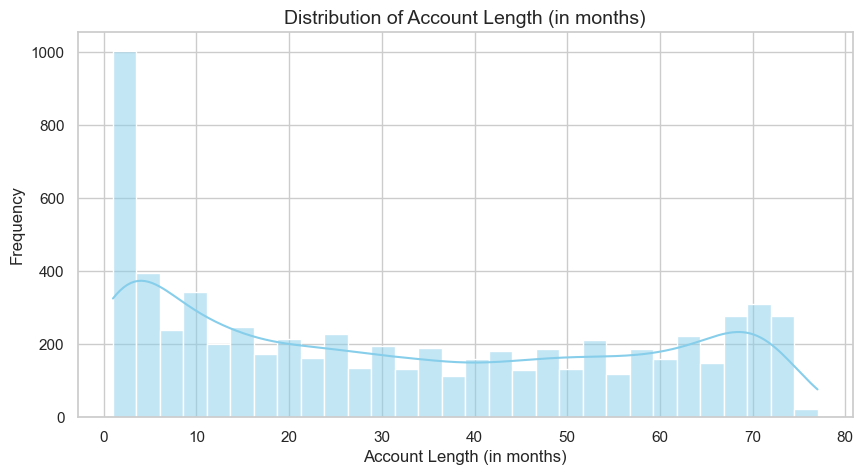

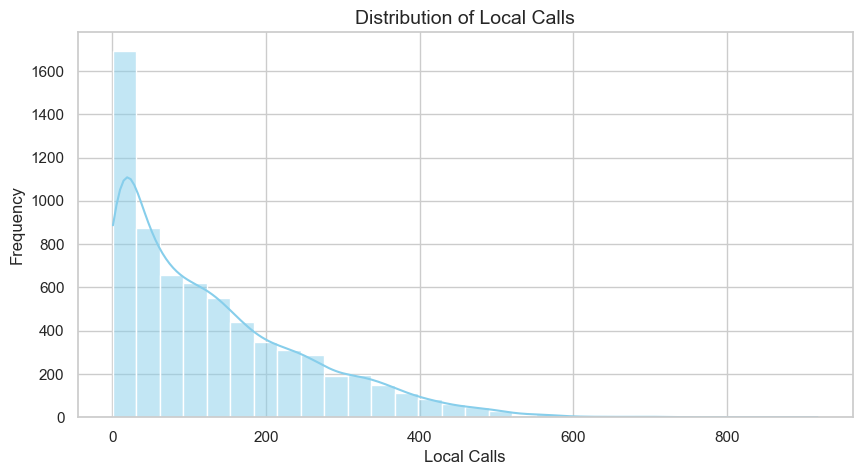

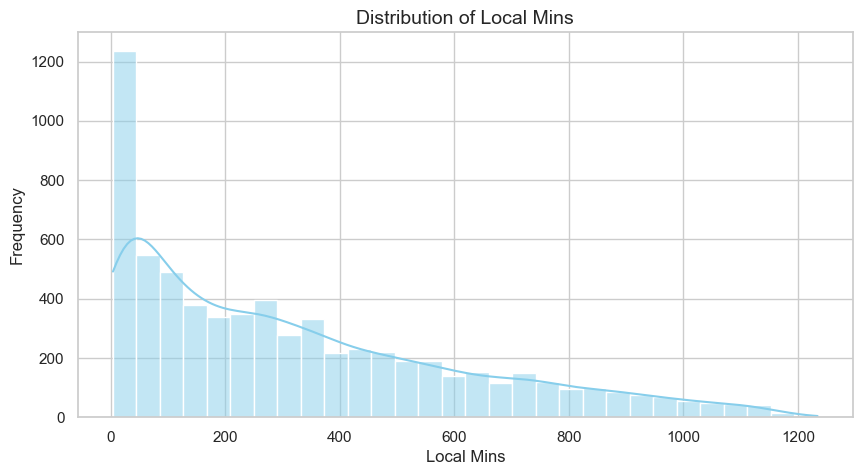

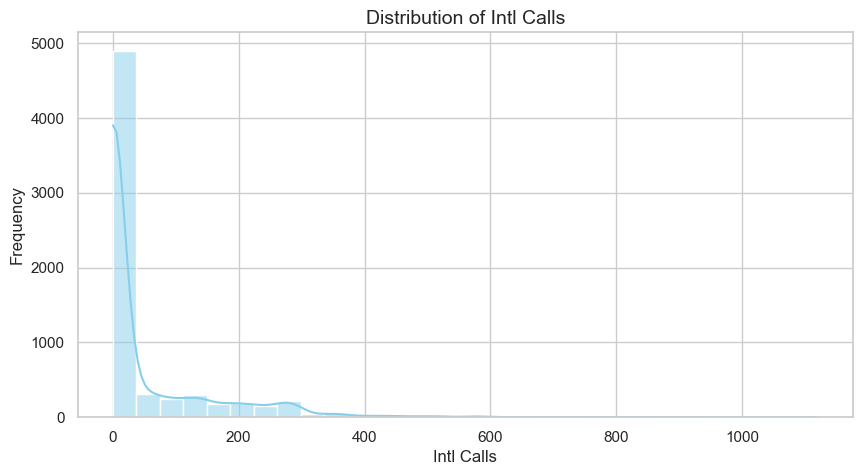

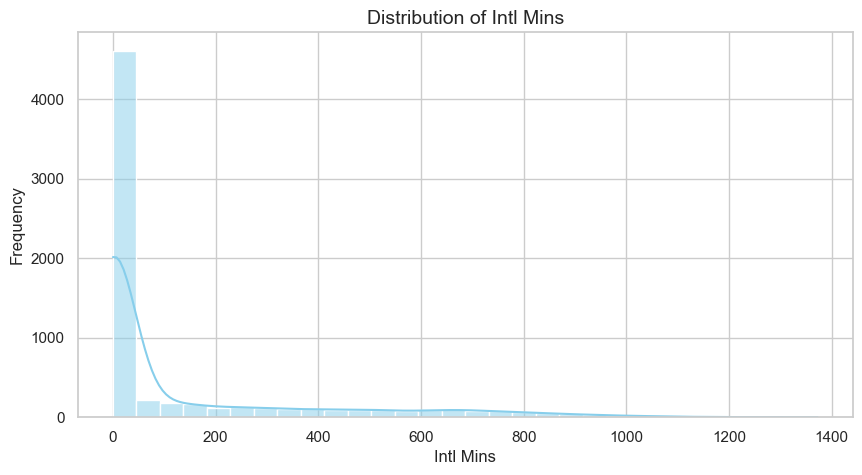

...

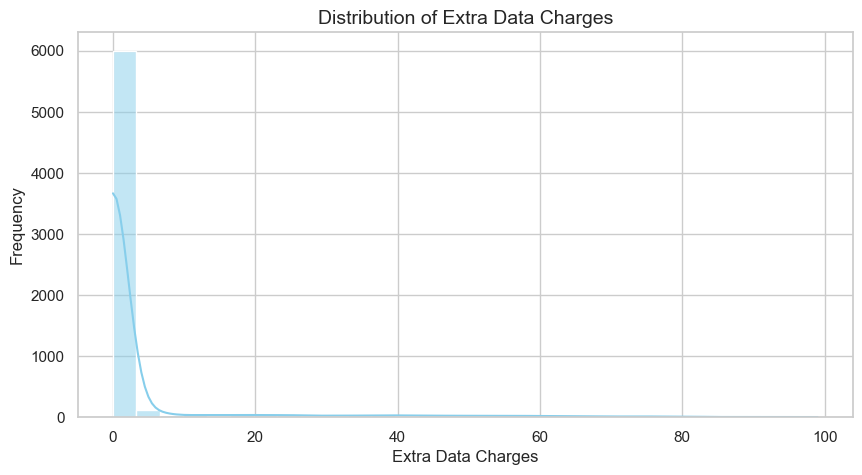

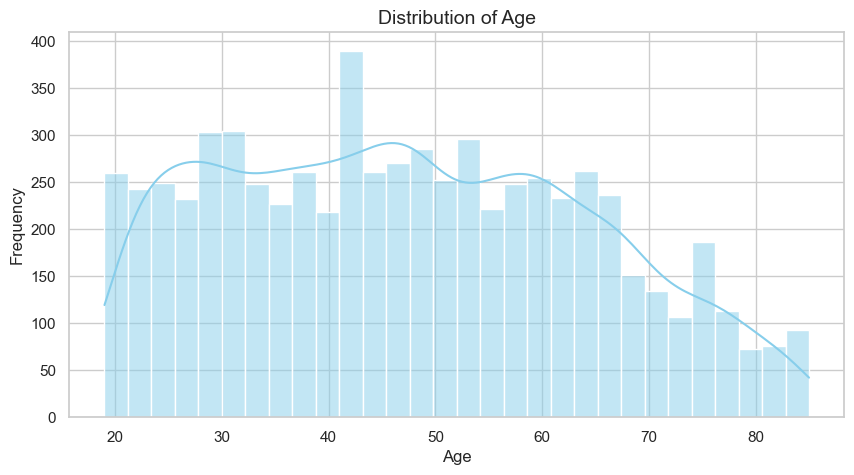

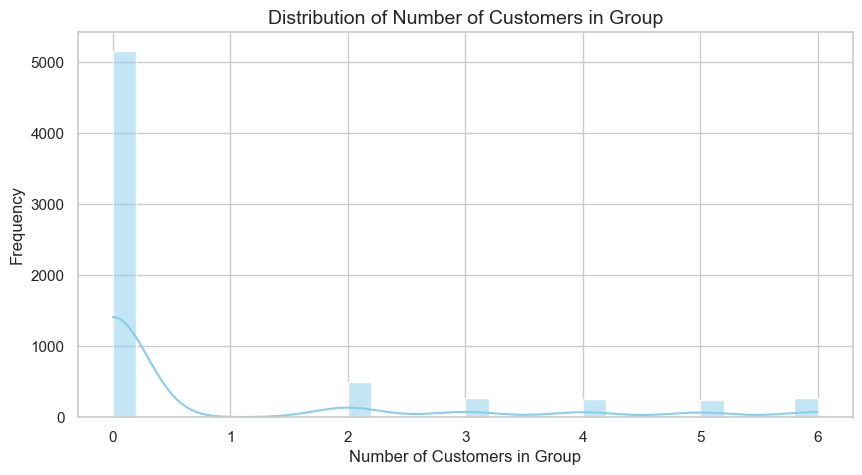

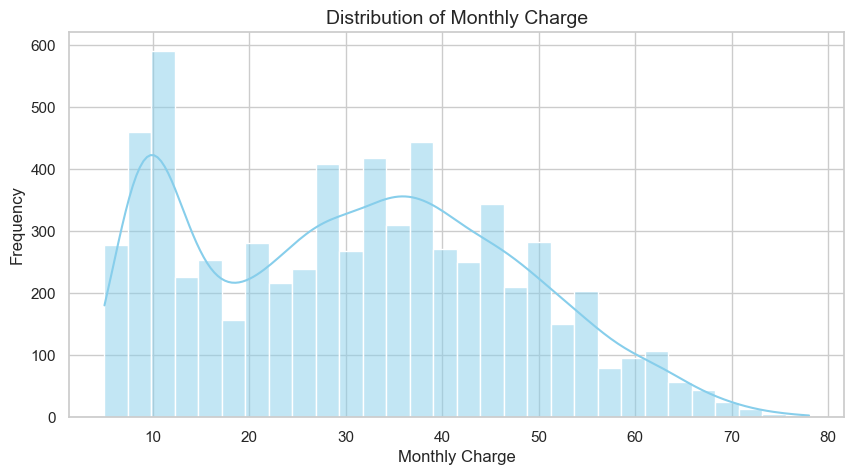

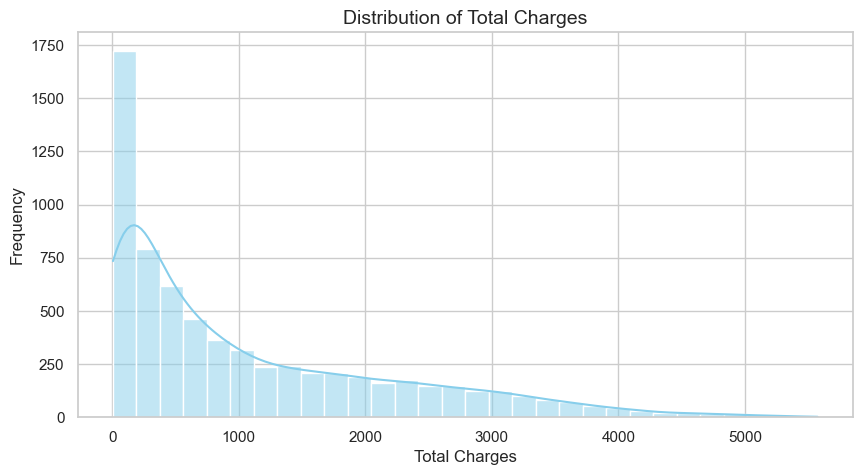

                                     Mean  Median          Std   Min     Max
Account Length (in months)      32.337820    29.0    24.595689   1.0    77.0
Local Calls                    130.974129    98.0   121.893966   1.0   918.0
Local Mins                     322.752864   250.5   288.619931   4.0  1234.2
Intl Calls                      51.097524     0.0   103.592369   0.0  1120.0
Intl Mins                      130.070624     0.0   243.527828   0.0  1372.5
Extra International Charges     33.641783     0.0    76.346828   0.0   585.8
Customer Service Calls           0.915657     0.0     1.411484   0.0     5.0
Avg Monthly GB Download          6.696276     5.0     7.454339   0.0    43.0
Extra Data Charges               3.374458     0.0    12.565309   0.0    99.0
Age                             47.448632    47.0    16.969893  19.0    85.0
Number of Customers in Group     0.837894     0.0     1.700780   0.0     6.0
Monthly Charge                  31.030357    31.0    16.288147   5.0    78.0

In [27]:
# Call the function to plot histograms and get statistics
statistics_df = plot_histograms_and_store_stats(data, numerical_cols)

# Display the summary statistics DataFrame
print(statistics_df)

In [28]:
# interpretation of the above data:


1. **Low Churn Rate**: A significant portion of customers (4,891 out of 6,687) have not churned, indicating a relatively stable customer base. However, monitoring the remaining churned customers is crucial for retention strategies.

2. **Flexibility in Contracts**: Most customers (3,411) prefer **Month-to-Month** contracts, which suggests that flexibility in contract terms is highly valued. Offering incentives for longer contracts could be a strategy to increase customer retention.

3. **Preference for Automated Payments**: The majority of customers (3,702) prefer to use **Direct Debit** as their payment method. This indicates that offering easy, automated payment options can improve customer satisfaction.

4. **Male-Dominated Customer Base**: The customer base skews male, with 3,379 male customers. It may be worth exploring whether marketing efforts can be adjusted to better appeal to other gender demographics.

5. **High Demand for Unlimited Data**: A significant portion of customers (4,494) have opted for **Unlimited Data Plans**, showing a strong preference for plans that eliminate data usage concerns.

6. **Low Use of International Plans**: The vast majority of customers (6,036) do not subscribe to an international plan. This indicates that international services are not a primary focus for most customers.

7. **Younger Customer Base**: Most customers (5,460) are **Not Seniors**, suggesting the majority are likely younger or middle-aged. This could guide targeted promotions and service offerings based on age groups.


In [30]:
# Setting the plot style for better readability
sns.set(style="whitegrid")

# Function to plot count plots and calculate summary statistics for categorical features
def plot_count_plots_and_store_stats(data, categorical_cols):
    # Create an empty DataFrame to store statistics
    stats_df = pd.DataFrame(columns=['Unique Categories', 'Most Frequent Category', 'Frequency'])

    for col in categorical_cols:
        # Plot count plot for the column
        plt.figure(figsize=(10, 5))
        sns.countplot(x=col, data=data, palette='Set2')
        plt.title(f'Distribution of {col}', fontsize=14)
        plt.xlabel(col)
        plt.ylabel('Count')
        plt.xticks(rotation=45)
        plt.grid(True)
        plt.show()

        # Calculate statistics for the column
        unique_categories = data[col].nunique()
        most_frequent_category = data[col].mode()[0]
        frequency_of_most_frequent = data[col].value_counts().iloc[0]

        # Store statistics in DataFrame
        stats_df.loc[col] = [unique_categories, most_frequent_category, frequency_of_most_frequent]

    return stats_df

In [31]:
# summary of above

The dataset reveals that most customers are younger, prefer flexible contracts, automated payments, and unlimited data plans. Churn is largely driven by competitive offers from other providers, indicating a need to focus on retention strategies through competitive pricing and improved services.


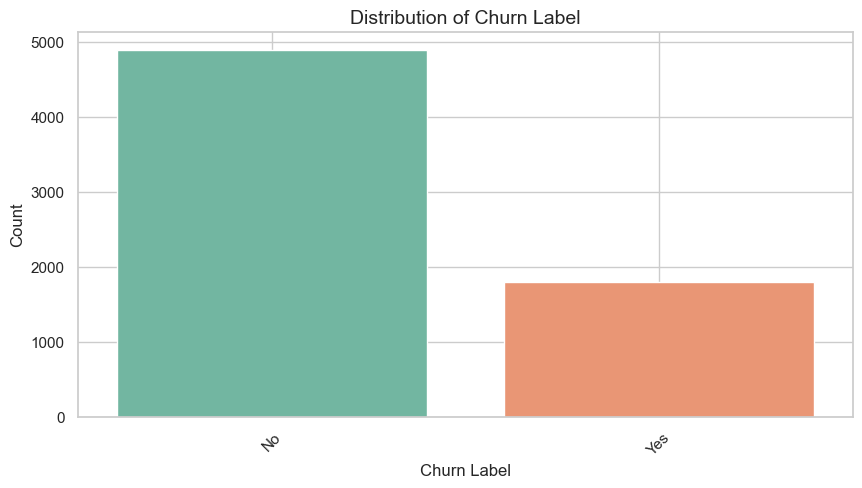

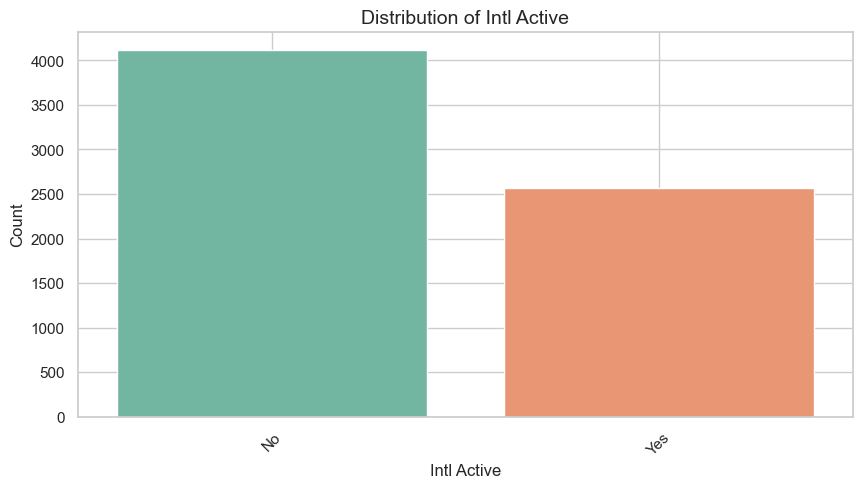

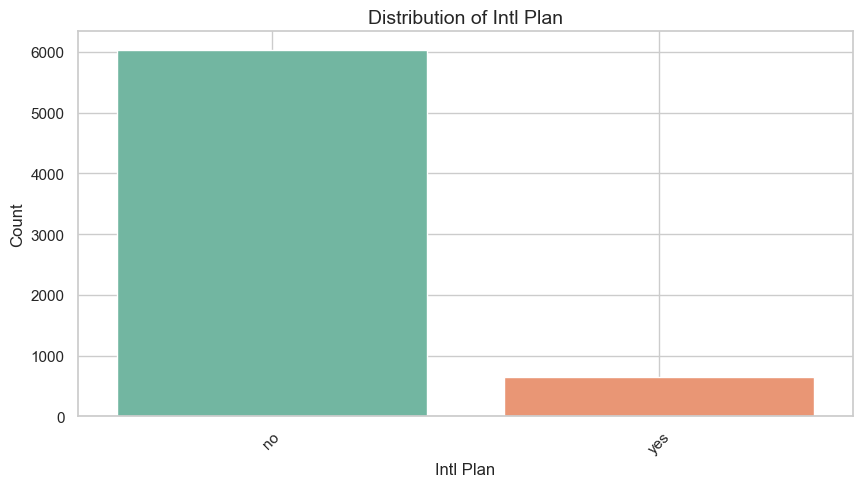

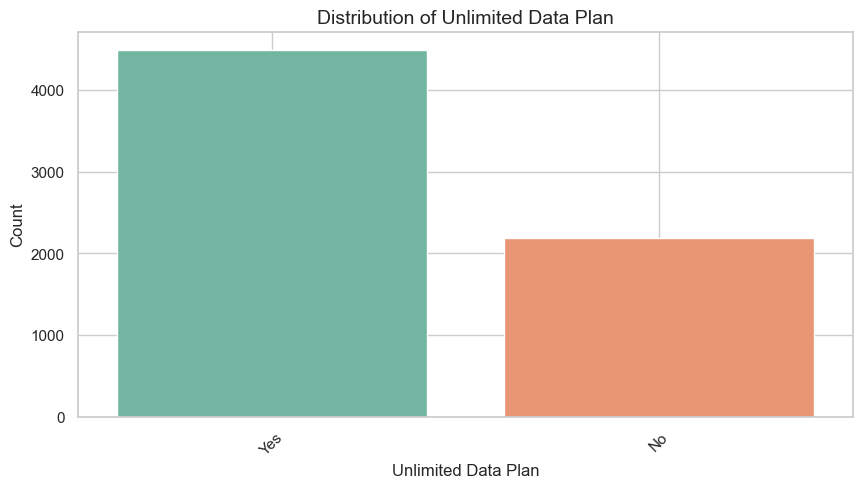

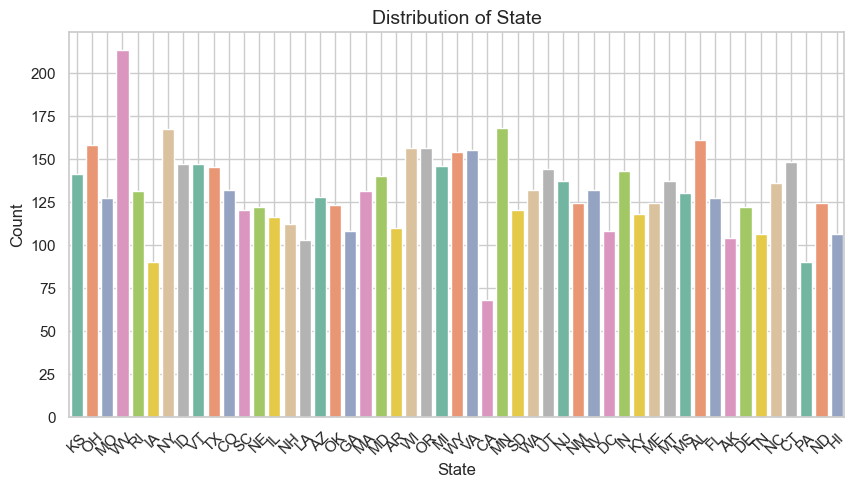

...

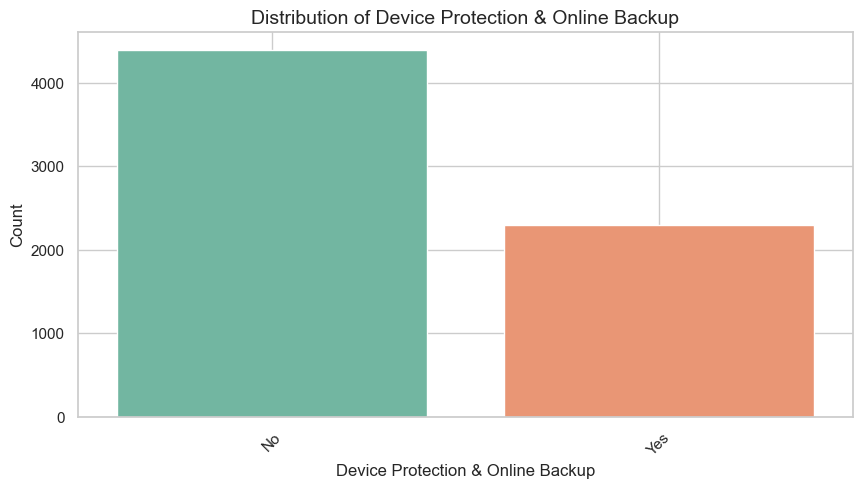

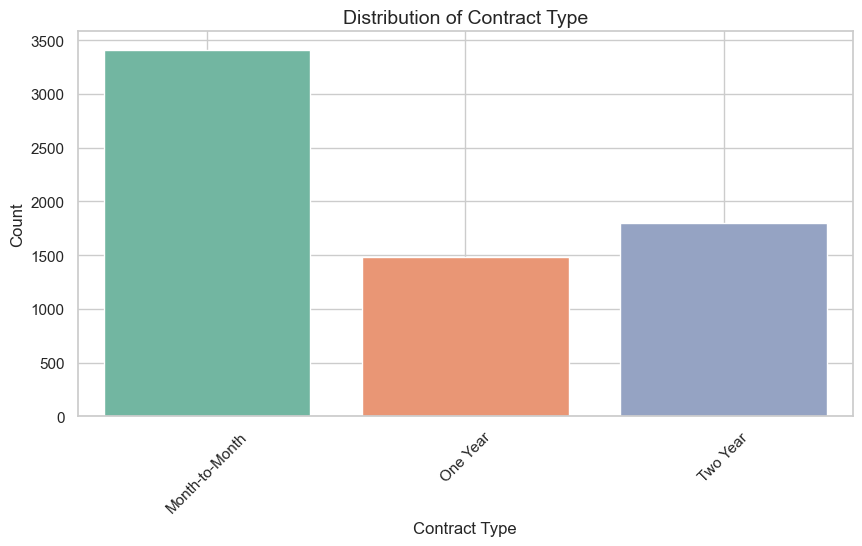

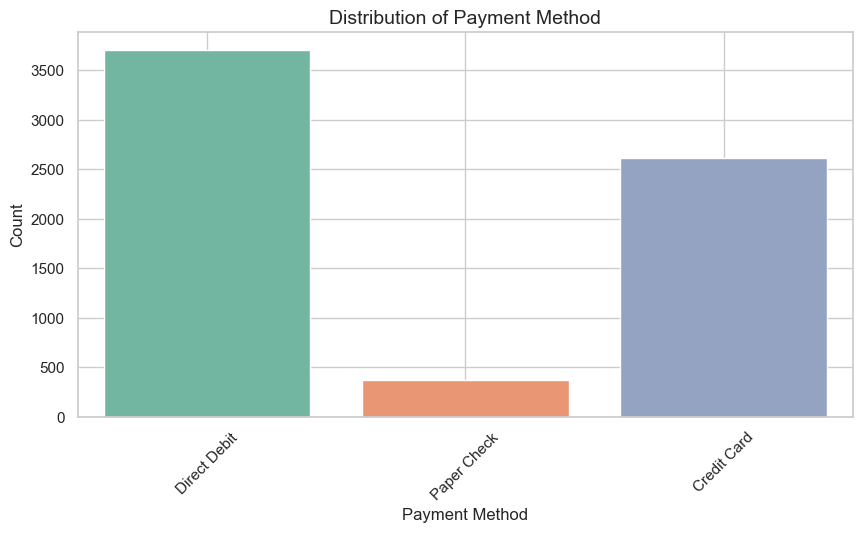

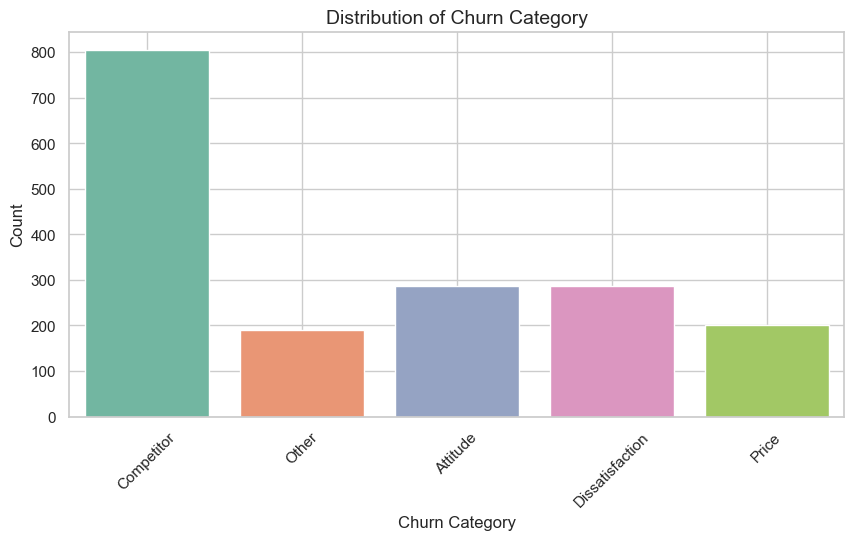

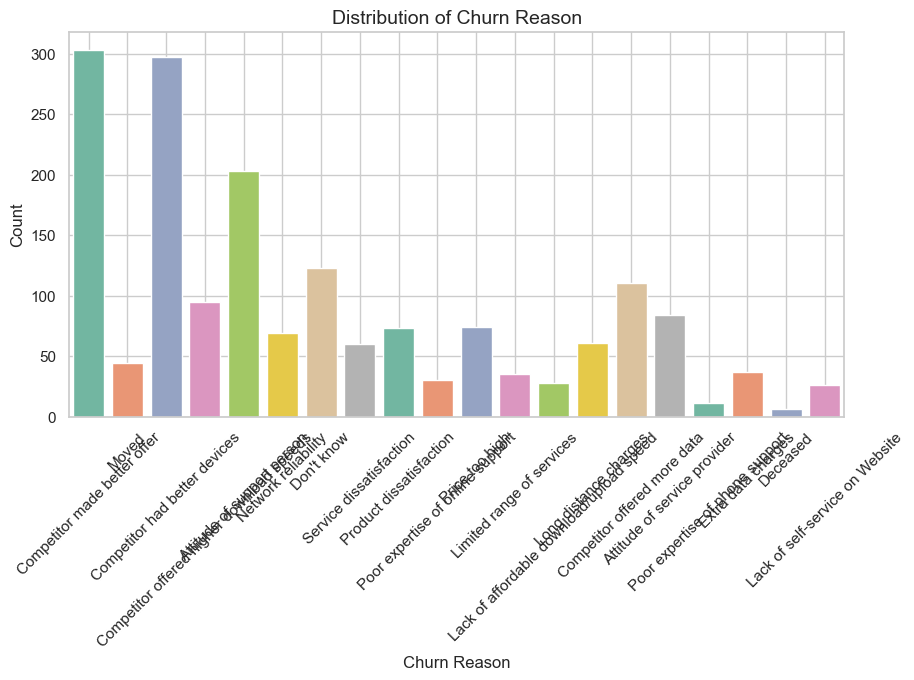

                                   Unique Categories  \
Churn Label                                        2   
Intl Active                                        2   
Intl Plan                                          2   
Unlimited Data Plan                                2   
State                                             51   
Gender                                             3   
Under 30                                           2   
Senior                                             2   
Group                                              2   
Device Protection & Online Backup                  2   
Contract Type                                      3   
Payment Method                                     3   
Churn Category                                     5   
Churn Reason                                      20   

                                         Most Frequent Category  Frequency  
Churn Label                                                  No       4891  
Intl 

In [34]:
# Call the function to plot count plots and get statistics
categorical_stats_df = plot_count_plots_and_store_stats(data, categorical_cols)

# Display the summary statistics DataFrame for categorical columns
print(categorical_stats_df)

In [36]:
# Display summary statistics for numerical features
print("Summary Statistics for Numerical Features:")
print(data[numerical_cols].describe())

Summary Statistics for Numerical Features:
       Account Length (in months)  Local Calls  Local Mins  Intl Calls  \
count                      6687.0       6687.0      6687.0      6687.0   
mean                     32.33782   130.974129  322.752864   51.097524   
std                     24.595689   121.893966  288.619931  103.592369   
min                           1.0          1.0         4.0         0.0   
25%                           9.0         31.0        76.9         0.0   
50%                          29.0         98.0       250.5         0.0   
75%                          55.0        199.0      498.05        52.0   
max                          77.0        918.0      1234.2      1120.0   

        Intl Mins  Extra International Charges  Customer Service Calls  \
count      6687.0                       6687.0                  6687.0   
mean   130.070624                    33.641783                0.915657   
std    243.527828                    76.346828                1.4114

In [38]:
# Display value counts for categorical features
print("Value Counts for Categorical Features:")
for col in numerical_cols:
    print(f"\n{col} Value Counts:")
    print(data[col].value_counts())

Value Counts for Categorical Features:

Account Length (in months) Value Counts:
Account Length (in months)
1     591
2     225
3     188
71    167
4     161
     ... 
39     48
74     39
75     14
77      5
76      3
Name: count, Length: 77, dtype: Int64

Local Calls Value Counts:
Local Calls
6      143
4      134
5      126
2      115
3      109
      ... 
501      1
918      1
341      1
497      1
461      1
Name: count, Length: 521, dtype: Int64

Local Mins Value Counts:
Local Mins
15.0     57
14.0     57
7.0      54
11.0     49
4.0      48
         ..
62.0      1
53.8      1
778.9     1
150.1     1
144.2     1
Name: count, Length: 4222, dtype: Int64

Intl Calls Value Counts:
Intl Calls
0.0      4116
4.0       168
8.0        75
12.0       68
16.0       60
         ... 
465.0       1
245.0       1
345.0       1
728.0       1
16.8        1
Name: count, Length: 335, dtype: Int64

Intl Mins Value Counts:
Intl Mins
0.0      4116
9.7        12
12.8       11
12.1        9
13.3        7
 

In [42]:
# Interpretation of the results above

- Most customers do not heavily utilize international services, and many do not incur extra data or international charges.
- The median customer makes few customer service calls and does not belong to a group.
- Monthly charges and data usage vary significantly, with a subset of customers having much higher values than others.
- Churn is largely driven by competitors offering better deals, with a significant portion of customers leaving for this reason.ason.


In [47]:
# Bivariable EDA

In [50]:
# Setting the plot style for better readability
sns.set(style="whitegrid")

# 1. Churn vs Monthly Charges: Box Plot
def plot_churn_vs_monthly_charges(data):
    """
    This function plots a boxplot to compare the distribution of monthly charges 
    between churners (Churn Label = Yes) and non-churners (Churn Label = No).
    """
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Churn Label', y='Monthly Charge', data=data, palette='Set2')
    plt.title('Churn vs Monthly Charges', fontsize=14)
    plt.xlabel('Churn')
    plt.ylabel('Monthly Charge')
    plt.grid(True)
    plt.show()

# 2. Churn vs Contract Type: Bar Plot
def plot_churn_vs_contract_type(data):
    """
    This function creates a bar plot showing the count of churners and non-churners 
    across different contract types (Month-to-Month, One Year, Two Year).
    """
    plt.figure(figsize=(10, 6))
    sns.countplot(x='Contract Type', hue='Churn Label', data=data, palette='Set1')
    plt.title('Churn vs Contract Type', fontsize=14)
    plt.xlabel('Contract Type')
    plt.ylabel('Count')
    plt.grid(True)
    plt.show()

# 3. Churn vs Payment Method: Bar Plot
def plot_churn_vs_payment_method(data):
    """
    This function creates a bar plot showing the churn rate across different 
    payment methods (Direct Debit, Credit Card, Paper Check).
    """
    plt.figure(figsize=(10, 6))
    sns.countplot(x='Payment Method', hue='Churn Label', data=data, palette='Set3')
    plt.title('Churn vs Payment Method', fontsize=14)
    plt.xlabel('Payment Method')
    plt.ylabel('Count')
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.show()

# 4. Correlation Heatmap: Shows relationships between numerical features
def plot_correlation_heatmap(data, numerical_cols):
    """
    This function creates a heatmap to display correlations between numerical features. 
    It helps in identifying multi-collinearity among the features, which is useful for 
    feature selection in modeling.
    """
    plt.figure(figsize=(12, 8))
    correlation_matrix = data[numerical_cols].corr()  # Compute the correlation matrix
    correlation_matrix
    sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
    plt.title('Correlation Heatmap of Numerical Features', fontsize=14)
    plt.show()

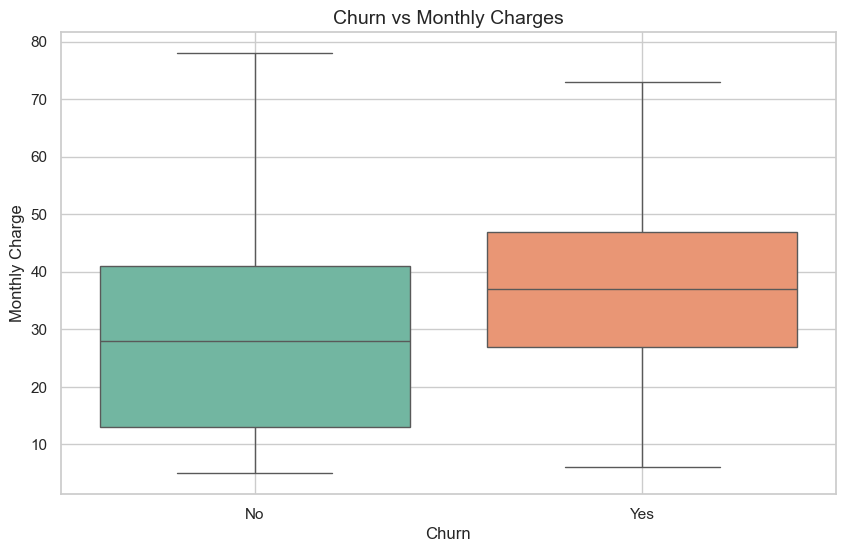

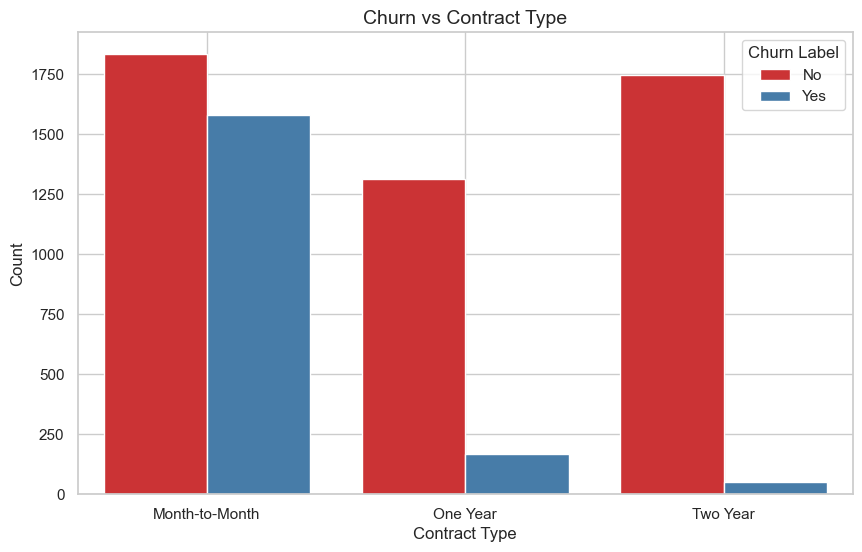

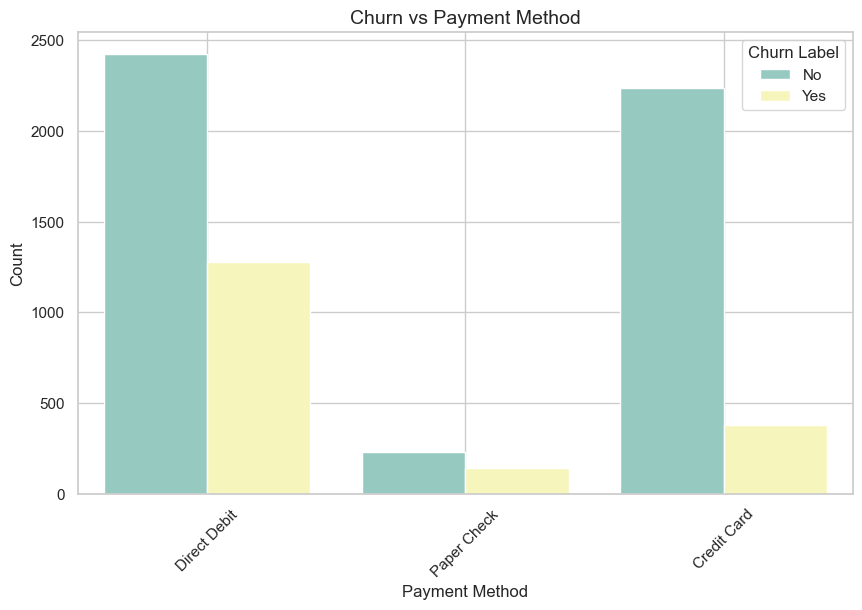

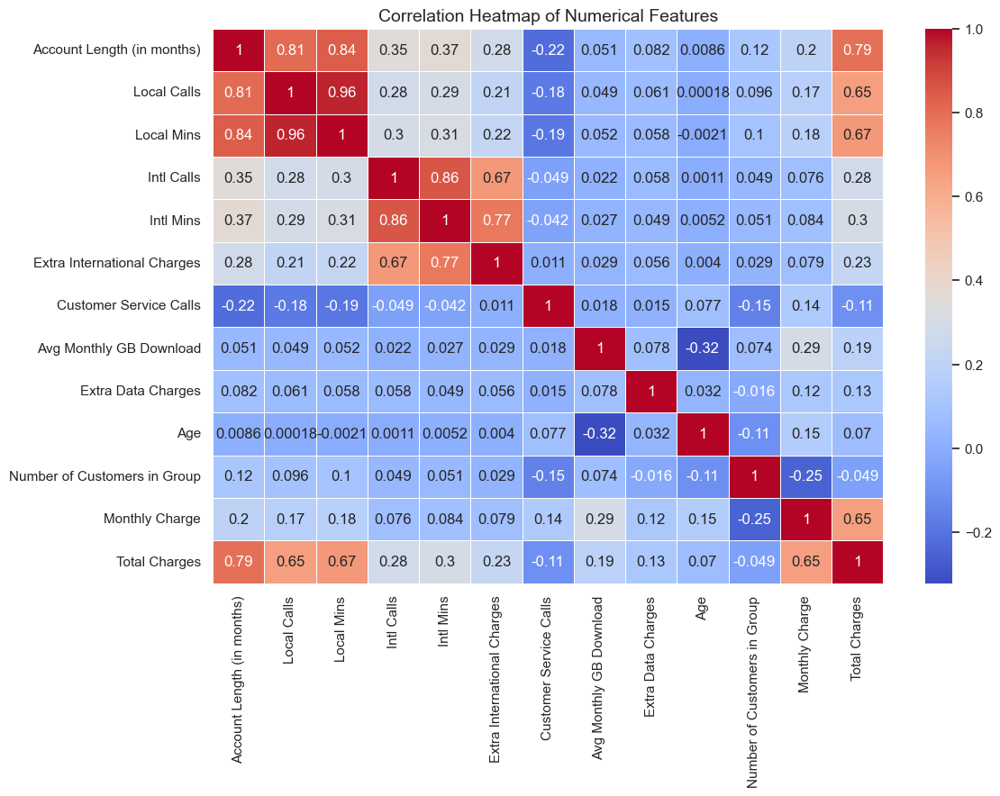

In [55]:
# Call the functions to perform bivariate analysis
plot_churn_vs_monthly_charges(data)
plot_churn_vs_contract_type(data)
plot_churn_vs_payment_method(data)
plot_correlation_heatmap(data, numerical_cols)

In [57]:
#### Interpretation of above results:


- **Higher Monthly Charges** are more associated with churn, especially for customers on **Month-to-Month contracts**.
- Customers on **longer contracts** (One or Two Year) are significantly less likely to churn, suggesting a potential strategy to offer **long-term incentives** to reduce churn.
- **Direct Debit** is the most common payment method, but it still has a high churn rate. This suggests that **payment method alone does not strongly influence churn**.
- **Customer Service Calls** and **Account Length** have a negative relationship, indicating that customers who make frequent service calls may be at risk of **churn earlier in their lifecycle**.

By addressing high monthly charges, encouraging customers to move to long-term contracts, and promoting automated payment methods, Databel can significantly reduce customer churn and improve retention.

In [59]:
# Mutlti EDA

In [60]:
# Setting plot style
sns.set(style="whitegrid")

# 1. Pair Plots: Visualizing relationships between numerical features and churn
def plot_pair_plots(data, features):
    """
    This function creates pair plots to observe the interaction between pairs of 
    numerical features and how they relate to churn.
    """
    plt.figure(figsize=(10, 8))
    sns.pairplot(data[features + ['Churn Label']], hue='Churn Label', palette='Set1', diag_kind='kde')
    plt.title('Pair Plot of Numerical Features and Churn', fontsize=14)
    plt.show()

# 2. Churn by Demographic Groups (Age Group, Senior Status, Gender)
def plot_churn_by_demographics(data):
    """
    This function plots churn rates by demographic groups: 
    - Age Group: Bucket customers by age ranges (e.g., <30, 30-50, 50+)
    - Senior Status: Are senior customers more likely to churn?
    - Gender: Does gender affect churn rates?
    """
    # Creating an Age Group column for analysis
    data['Age Group'] = pd.cut(data['Age'], bins=[0, 30, 50, 100], labels=['<30', '30-50', '50+'])

    # Plot Churn by Age Group
    plt.figure(figsize=(10, 6))
    sns.countplot(x='Age Group', hue='Churn Label', data=data, palette='Set2')
    plt.title('Churn by Age Group', fontsize=14)
    plt.xlabel('Age Group')
    plt.ylabel('Count')
    plt.grid(True)
    plt.show()

    # Plot Churn by Senior Status
    plt.figure(figsize=(10, 6))
    sns.countplot(x='Senior', hue='Churn Label', data=data, palette='Set2')
    plt.title('Churn by Senior Status', fontsize=14)
    plt.xlabel('Senior Status')
    plt.ylabel('Count')
    plt.grid(True)
    plt.show()

    # Plot Churn by Gender
    plt.figure(figsize=(10, 6))
    sns.countplot(x='Gender', hue='Churn Label', data=data, palette='Set2')
    plt.title('Churn by Gender', fontsize=14)
    plt.xlabel('Gender')
    plt.ylabel('Count')
    plt.grid(True)
    plt.show()

# 3. Interaction Features: Contract Type and Customer Service Calls
def plot_interaction_features(data):
    """
    This function examines the interaction between Contract Type and Customer Service Calls 
    and their relationship with churn.
    """
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='Contract Type', y='Customer Service Calls', hue='Churn Label', data=data, palette='Set3')
    plt.title('Interaction of Contract Type and Customer Service Calls on Churn', fontsize=14)
    plt.xlabel('Contract Type')
    plt.ylabel('Number of Customer Service Calls')
    plt.grid(True)
    plt.show()


<Figure size 1000x800 with 0 Axes>

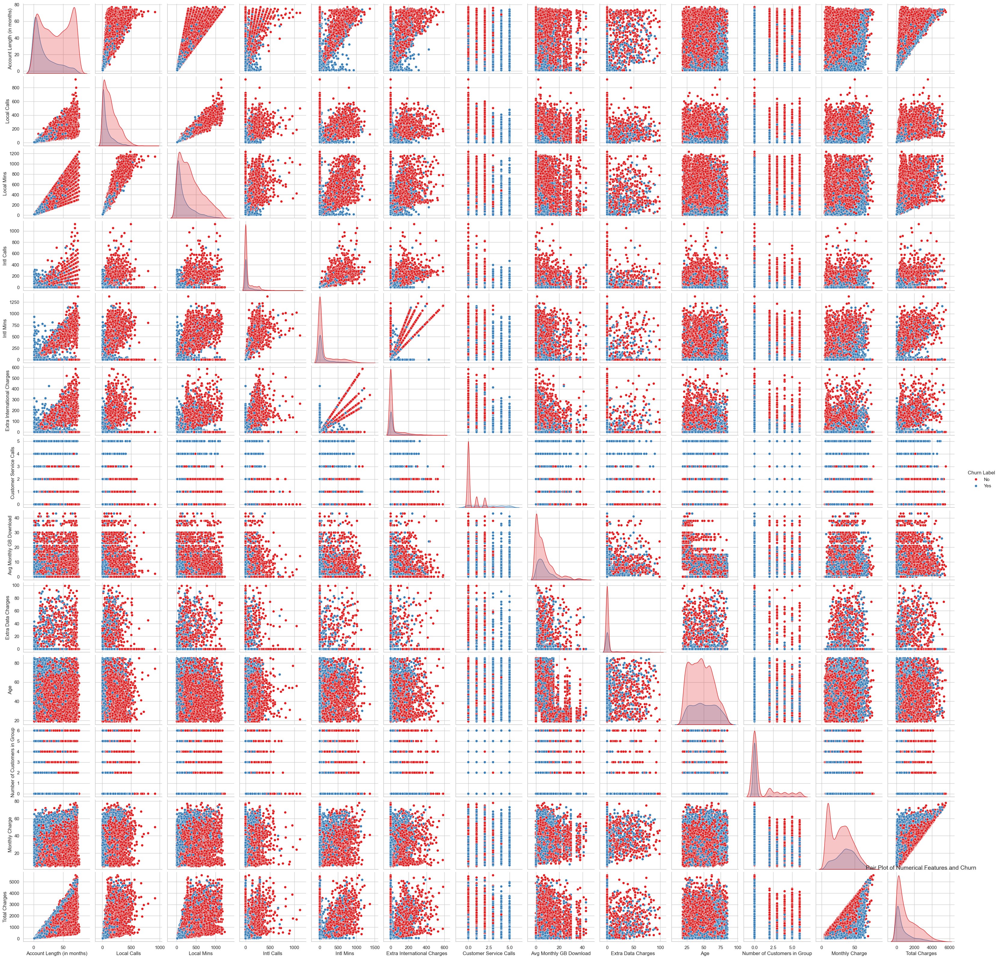

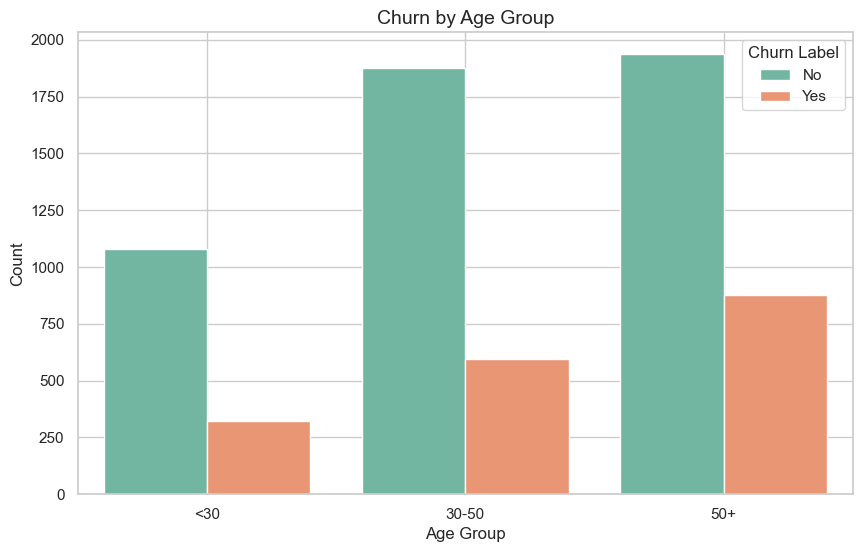

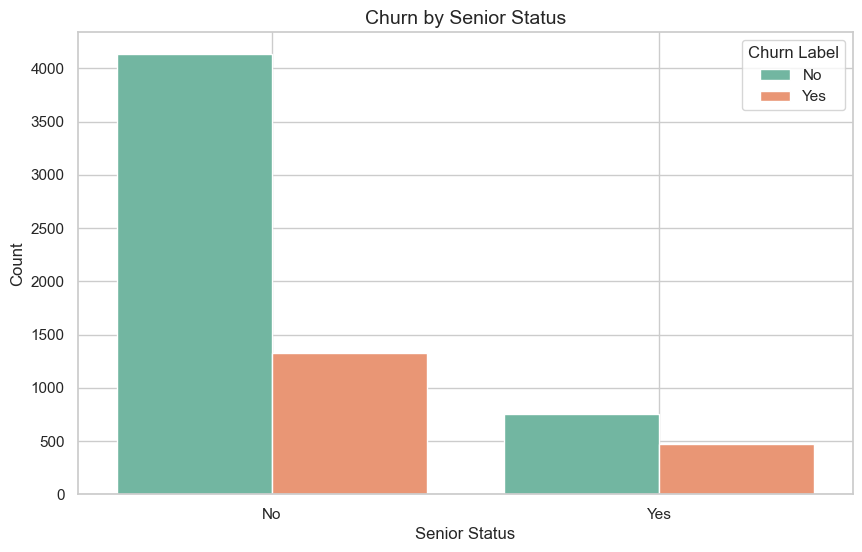

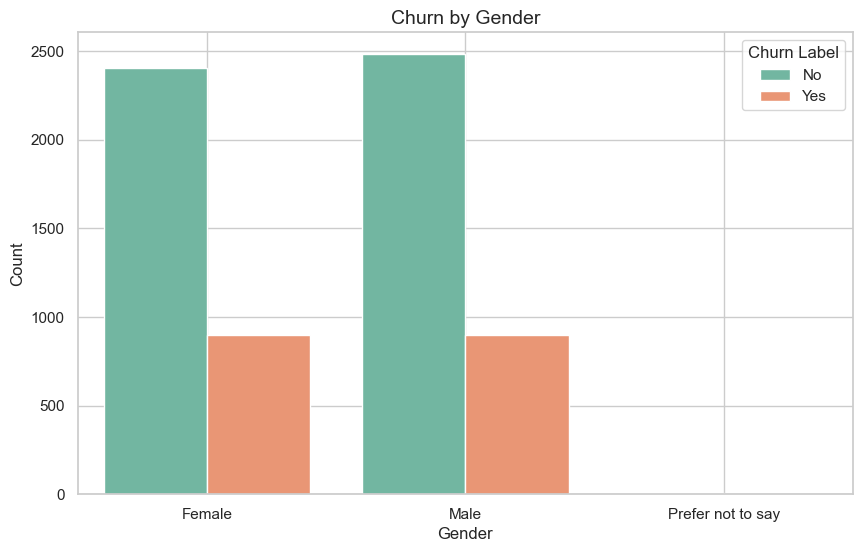

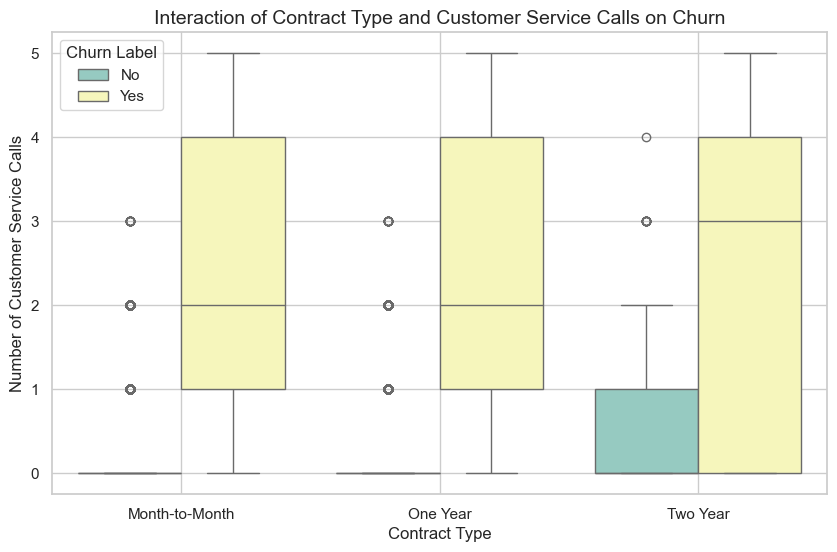

In [61]:
#Numerical Columns:
numerical_features = ['Account Length (in months)', 'Local Calls', 'Local Mins', 'Intl Calls', 'Intl Mins', 'Extra International Charges', 'Customer Service Calls', 'Avg Monthly GB Download', 'Extra Data Charges', 'Age', 'Number of Customers in Group', 'Monthly Charge', 'Total Charges']

# Call the functions for multivariate analysis
plot_pair_plots(data, numerical_features)
plot_churn_by_demographics(data)
plot_interaction_features(data)


In [62]:
# Interpretation of the results above

- Customers who stay longer with the company, use more services (local calls and minutes), and are part of groups are less likely to churn.
- High monthly charges and frequent customer service interactions are strong indicators of churn, especially for customers on flexible month-to-month contracts.
- Targeting older customers, offering long-term contract incentives, and addressing customer service issues early can help reduce churn.


In [64]:
# EPA Key takeways


The analysis of customer churn reveals several key insights that can help in developing strategies to reduce churn:

- **Account Length**: Customers who stay with the company longer are less likely to churn. However, those who churn tend to leave early, with a median account length of just 10 months. Focus should be placed on improving customer retention early in the customer lifecycle.

- **Service Usage**: Non-churners consistently have higher usage in local calls, local minutes, and international services. Customers with lower usage are at a higher risk of churn, suggesting that efforts should be made to increase engagement and service utilization among low-usage customers.

- **Customer Service Calls**: Frequent interactions with customer service are a clear indicator of dissatisfaction, particularly for churners. Customers who churn make significantly more customer service calls than those who remain, especially those on month-to-month contracts. Addressing customer issues promptly and efficiently could mitigate churn risks.

- **Monthly Charges**: Churners typically have higher monthly charges compared to non-churners. Offering competitive pricing or discounts to high-paying customers may reduce churn, especially for those on month-to-month contracts.

- **Group Membership**: Customers who are part of a group (e.g., family plans) tend to stay longer with the company. Encouraging group memberships could be a useful retention strategy.

- **Demographics**: Older customers and seniors are more likely to churn. Special attention should be given to these demographic groups, possibly through tailored offers or customer support initiatives.

Overall, reducing churn requires a combination of strategies focusing on improving early retention, addressing customer service issues, promoting service engagement, offering competitive pricing, and targeting specific demographic groups. A proactive approach in these areas can help retain customers and reduce churn in the long term.


In [66]:
# END of Data Understanding

## Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling.

In [68]:
# Drop duplicates
data.drop_duplicates(inplace=True)
data.head()

,Customer ID,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,...,Group,Number of Customers in Group,Device Protection & Online Backup,Contract Type,Payment Method,Monthly Charge,Total Charges,Churn Category,Churn Reason,Age Group
0,4444-BZPU,No,1,3,8.0,0.0,0.0,No,no,0.0,...,No,0,No,Month-to-Month,Direct Debit,10,10,<NA>,<NA>,30-50
1,5676-PTZX,No,33,179,431.3,0.0,0.0,No,no,0.0,...,No,0,Yes,One Year,Paper Check,21,703,<NA>,<NA>,30-50
2,8532-ZEKQ,No,44,82,217.6,0.0,0.0,No,yes,0.0,...,No,0,Yes,One Year,Direct Debit,23,1014,<NA>,<NA>,50+
3,1314-SMPJ,No,10,47,111.6,60.0,71.0,Yes,yes,0.0,...,No,0,No,Month-to-Month,Paper Check,17,177,<NA>,<NA>,30-50
4,2956-TXCJ,No,62,184,621.2,310.0,694.4,Yes,yes,0.0,...,No,0,No,One Year,Direct Debit,28,1720,<NA>,<NA>,50+


Since Churn Category and Churn Reason are only relevant to customers who have churned, I will fill missing values for non-churned customers with a placeholder 
such as "Not Applicable". This will maintain the distinction between customers who have churned and those who haven't.

In [70]:
# Filling missing Churn Category and Churn Reason with 'Not Applicable' for non-churners
data['Churn Category'].fillna('Not Applicable', inplace=True)
data['Churn Reason'].fillna('Not Applicable', inplace=True)

data.head()

,Customer ID,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,...,Group,Number of Customers in Group,Device Protection & Online Backup,Contract Type,Payment Method,Monthly Charge,Total Charges,Churn Category,Churn Reason,Age Group
0,4444-BZPU,No,1,3,8.0,0.0,0.0,No,no,0.0,...,No,0,No,Month-to-Month,Direct Debit,10,10,Not Applicable,Not Applicable,30-50
1,5676-PTZX,No,33,179,431.3,0.0,0.0,No,no,0.0,...,No,0,Yes,One Year,Paper Check,21,703,Not Applicable,Not Applicable,30-50
2,8532-ZEKQ,No,44,82,217.6,0.0,0.0,No,yes,0.0,...,No,0,Yes,One Year,Direct Debit,23,1014,Not Applicable,Not Applicable,50+
3,1314-SMPJ,No,10,47,111.6,60.0,71.0,Yes,yes,0.0,...,No,0,No,Month-to-Month,Paper Check,17,177,Not Applicable,Not Applicable,30-50
4,2956-TXCJ,No,62,184,621.2,310.0,694.4,Yes,yes,0.0,...,No,0,No,One Year,Direct Debit,28,1720,Not Applicable,Not Applicable,50+


Phone Number or Customer ID, may have no predictive value and can be excluded from the analysis. 


In [72]:
# Dropping 'Customer ID' and 'Phone Number' only if they still exist in the dataset. 
columns_to_drop = ['Customer ID', 'Phone Number']

# Checking if the columns exist before dropping them
columns_to_drop = [col for col in columns_to_drop if col in data.columns]

# Drop the columns if they exist
if columns_to_drop:
    data = data.drop(columns=columns_to_drop)
    print(f"Dropped columns: {columns_to_drop}")
else:
    print("No columns to drop.")

# Check the cleaned dataset
print(data.info())
data.head()


Dropped columns: ['Customer ID', 'Phone Number']
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6687 entries, 0 to 6686
Data columns (total 28 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   Churn Label                        6687 non-null   string  
 1   Account Length (in months)         6687 non-null   Int64   
 2   Local Calls                        6687 non-null   Int64   
 3   Local Mins                         6687 non-null   Float64 
 4   Intl Calls                         6687 non-null   Float64 
 5   Intl Mins                          6687 non-null   Float64 
 6   Intl Active                        6687 non-null   string  
 7   Intl Plan                          6687 non-null   string  
 8   Extra International Charges        6687 non-null   Float64 
 9   Customer Service Calls             6687 non-null   Int64   
 10  Avg Monthly GB Download            6687 non-null   Int64   

,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,Customer Service Calls,...,Group,Number of Customers in Group,Device Protection & Online Backup,Contract Type,Payment Method,Monthly Charge,Total Charges,Churn Category,Churn Reason,Age Group
0,No,1,3,8.0,0.0,0.0,No,no,0.0,0,...,No,0,No,Month-to-Month,Direct Debit,10,10,Not Applicable,Not Applicable,30-50
1,No,33,179,431.3,0.0,0.0,No,no,0.0,0,...,No,0,Yes,One Year,Paper Check,21,703,Not Applicable,Not Applicable,30-50
2,No,44,82,217.6,0.0,0.0,No,yes,0.0,0,...,No,0,Yes,One Year,Direct Debit,23,1014,Not Applicable,Not Applicable,50+
3,No,10,47,111.6,60.0,71.0,Yes,yes,0.0,0,...,No,0,No,Month-to-Month,Paper Check,17,177,Not Applicable,Not Applicable,30-50
4,No,62,184,621.2,310.0,694.4,Yes,yes,0.0,0,...,No,0,No,One Year,Direct Debit,28,1720,Not Applicable,Not Applicable,50+


In [73]:
# Verify if we still have NaN values for each feature
for column in data.columns:
    print(f'Percent of missing {column} records is %.2f%%' %((data[column].isnull().sum()/data.shape[0])*100))

Percent of missing Churn Label records is 0.00%
Percent of missing Account Length (in months) records is 0.00%
Percent of missing Local Calls records is 0.00%
Percent of missing Local Mins records is 0.00%
Percent of missing Intl Calls records is 0.00%
Percent of missing Intl Mins records is 0.00%
Percent of missing Intl Active records is 0.00%
Percent of missing Intl Plan records is 0.00%
Percent of missing Extra International Charges records is 0.00%
Percent of missing Customer Service Calls records is 0.00%
Percent of missing Avg Monthly GB Download records is 0.00%
Percent of missing Unlimited Data Plan records is 0.00%
Percent of missing Extra Data Charges records is 0.00%
Percent of missing State records is 0.00%
Percent of missing Gender records is 0.00%
Percent of missing Age records is 0.00%
Percent of missing Under 30 records is 0.00%
Percent of missing Senior records is 0.00%
Percent of missing Group records is 0.00%
Percent of missing Number of Customers in Group records is

In [74]:
# Check the number of records where the value is 0
zero_records = data.eq(0).sum()
zero_percentage = (zero_records / len(data)) * 100  # Calculate the percentage of zero values

# Display the number of zero records and their percentage
print(zero_records)
print("\n---------------------------------------\n")

# Calculate the percentage of zero values for each column
for column in data.columns:
    zero_percentage = (data[column].eq(0).sum() / data.shape[0]) * 100
    print(f'Percent of zero {column} records is %.2f%%' % zero_percentage)

Churn Label                             0
Account Length (in months)              0
Local Calls                             0
Local Mins                              0
Intl Calls                           4116
Intl Mins                            4116
Intl Active                             0
Intl Plan                               0
Extra International Charges          4464
Customer Service Calls               4056
Avg Monthly GB Download              1485
Unlimited Data Plan                     0
Extra Data Charges                   5999
State                                   0
Gender                                  0
Age                                     0
Under 30                                0
Senior                                  0
Group                                   0
Number of Customers in Group         5166
Device Protection & Online Backup       0
Contract Type                           0
Payment Method                          0
Monthly Charge                    

In [75]:
# Handling of Zeros in data



Over 60% of the values for international calls, international minutes, and extra international charges are zero, indicating that many customers don't use international services.

I will keep the zeros because they represent valid information (customers who don't use international services).
Also, I will be creating binary indicators ( Has Intl Calls, Has Intl Charges) to differentiate between users who make international calls and those who don’t.

In [77]:
data['Has Intl Calls'] = (data['Intl Calls'] > 0).astype(int)
data['Has Intl Charges'] = (data['Extra International Charges'] > 0).astype(int)

##### Customer Service Calls:
 60.66% of customers have zero customer service calls, indicating they didn’t contact customer support.

I will keep the zeros since they are valid (no customer service interactions).
I am creating a binary feature to flag whether a customer contacted support

In [79]:
data['Contacted Support'] = (data['Customer Service Calls'] > 0).astype(int)

##### Avg Monthly GB Download:
22.21% of customers have zero data usage. This could indicate either customers with no internet usage or issues with data reporting.

I will create a binary flag for customers with zero data usage.


In [85]:
data['Zero Data Usage'] = (data['Avg Monthly GB Download'] == 0).astype(int)

##### Extra Data Charges:
89.71% of customers have zero extra data charges, indicating that most customers don’t exceed their data limits.

I will keep the zeros as they indicate no extra data charges.
I will Create a binary flag indicating whether a customer has incurred extra data charges.

In [87]:
data['Has Extra Data Charges'] = (data['Extra Data Charges'] > 0).astype(int)

##### Number of Customers in Group:
Context 77.25% of customers have zero group members, indicating that most customers are not part of a group plan.

I will Keep the zeros, as they represent individual customers.
I am creating a binary feature indicating whether the customer is part of a group

In [89]:
data['Is In Group'] = (data['Number of Customers in Group'] > 0).astype(int)

In [90]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6687 entries, 0 to 6686
Data columns (total 34 columns):
 #   Column                             Non-Null Count  Dtype   
---  ------                             --------------  -----   
 0   Churn Label                        6687 non-null   string  
 1   Account Length (in months)         6687 non-null   Int64   
 2   Local Calls                        6687 non-null   Int64   
 3   Local Mins                         6687 non-null   Float64 
 4   Intl Calls                         6687 non-null   Float64 
 5   Intl Mins                          6687 non-null   Float64 
 6   Intl Active                        6687 non-null   string  
 7   Intl Plan                          6687 non-null   string  
 8   Extra International Charges        6687 non-null   Float64 
 9   Customer Service Calls             6687 non-null   Int64   
 10  Avg Monthly GB Download            6687 non-null   Int64   
 11  Unlimited Data Plan                6687 non

In [91]:
# End of Data Preparation

## Modeling

With our (almost?) final dataset in hand, it is now time to build some models.  Here, we should build a number of different predictions or classifications models with 'Churn Label' as the target.  In building our models, we will  explore different parameters and be sure to cross-validate your findings.

In [168]:
data.head()

,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,Customer Service Calls,...,Total Charges,Churn Category,Churn Reason,Age Group,Has Intl Calls,Has Intl Charges,Contacted Support,Zero Data Usage,Has Extra Data Charges,Is In Group
0,No,1,3,8.0,0.0,0.0,No,no,0.0,0,...,10,Not Applicable,Not Applicable,30-50,0,0,0,0,0,0
1,No,33,179,431.3,0.0,0.0,No,no,0.0,0,...,703,Not Applicable,Not Applicable,30-50,0,0,0,0,0,0
2,No,44,82,217.6,0.0,0.0,No,yes,0.0,0,...,1014,Not Applicable,Not Applicable,50+,0,0,0,0,0,0
3,No,10,47,111.6,60.0,71.0,Yes,yes,0.0,0,...,177,Not Applicable,Not Applicable,30-50,1,0,0,0,0,0
4,No,62,184,621.2,310.0,694.4,Yes,yes,0.0,0,...,1720,Not Applicable,Not Applicable,50+,1,0,0,0,0,0


In [170]:
data.tail()

,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,Customer Service Calls,...,Total Charges,Churn Category,Churn Reason,Age Group,Has Intl Calls,Has Intl Charges,Contacted Support,Zero Data Usage,Has Extra Data Charges,Is In Group
6682,Yes,3,6,16.8,0.0,0.0,No,no,0.0,0,...,52,Competitor,Competitor offered higher download speeds,30-50,0,0,0,0,0,1
6683,Yes,1,7,15.0,0.0,0.0,No,no,0.0,5,...,20,Competitor,Competitor offered higher download speeds,<30,0,0,1,0,0,1
6684,Yes,6,20,46.9,0.0,0.0,No,no,0.0,4,...,108,Competitor,Competitor made better offer,30-50,0,0,1,0,0,1
6685,Yes,3,6,15.4,0.0,0.0,No,no,0.0,2,...,46,Attitude,Attitude of support person,30-50,0,0,1,0,0,1
6686,Yes,1,7,15.0,0.0,0.0,No,no,0.0,1,...,9,Competitor,Competitor made better offer,<30,0,0,1,0,1,1


In [172]:
# Data describe
data.describe(include = 'string')

,Churn Label,Intl Active,Intl Plan,Unlimited Data Plan,State,Gender,Under 30,Senior,Group,Device Protection & Online Backup,Contract Type,Payment Method,Churn Category,Churn Reason
count,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687,6687
unique,2,2,2,2,51,3,2,2,2,2,3,3,6,21
top,No,No,no,Yes,WV,Male,No,No,No,No,Month-to-Month,Direct Debit,Not Applicable,Not Applicable
freq,4891,4116,6036,4494,213,3379,5400,5460,5166,4393,3411,3702,4918,4918


In [174]:
data.head()

,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,Customer Service Calls,...,Total Charges,Churn Category,Churn Reason,Age Group,Has Intl Calls,Has Intl Charges,Contacted Support,Zero Data Usage,Has Extra Data Charges,Is In Group
0,No,1,3,8.0,0.0,0.0,No,no,0.0,0,...,10,Not Applicable,Not Applicable,30-50,0,0,0,0,0,0
1,No,33,179,431.3,0.0,0.0,No,no,0.0,0,...,703,Not Applicable,Not Applicable,30-50,0,0,0,0,0,0
2,No,44,82,217.6,0.0,0.0,No,yes,0.0,0,...,1014,Not Applicable,Not Applicable,50+,0,0,0,0,0,0
3,No,10,47,111.6,60.0,71.0,Yes,yes,0.0,0,...,177,Not Applicable,Not Applicable,30-50,1,0,0,0,0,0
4,No,62,184,621.2,310.0,694.4,Yes,yes,0.0,0,...,1720,Not Applicable,Not Applicable,50+,1,0,0,0,0,0


In [176]:
print(data.columns)

Index(['Churn Label', 'Account Length (in months)', 'Local Calls',
       'Local Mins', 'Intl Calls', 'Intl Mins', 'Intl Active', 'Intl Plan',
       'Extra International Charges', 'Customer Service Calls',
       'Avg Monthly GB Download', 'Unlimited Data Plan', 'Extra Data Charges',
       'State', 'Gender', 'Age', 'Under 30', 'Senior', 'Group',
       'Number of Customers in Group', 'Device Protection & Online Backup',
       'Contract Type', 'Payment Method', 'Monthly Charge', 'Total Charges',
       'Churn Category', 'Churn Reason', 'Age Group', 'Has Intl Calls',
       'Has Intl Charges', 'Contacted Support', 'Zero Data Usage',
       'Has Extra Data Charges', 'Is In Group'],
      dtype='object')


In [178]:
print(data.dtypes)

Churn Label                          string[python]
Account Length (in months)                    Int64
Local Calls                                   Int64
Local Mins                                  Float64
Intl Calls                                  Float64
Intl Mins                                   Float64
Intl Active                          string[python]
Intl Plan                            string[python]
Extra International Charges                 Float64
Customer Service Calls                        Int64
Avg Monthly GB Download                       Int64
Unlimited Data Plan                  string[python]
Extra Data Charges                            Int64
State                                string[python]
Gender                               string[python]
Age                                           Int64
Under 30                             string[python]
Senior                               string[python]
Group                                string[python]
Number of Cu

In [180]:
# data encoding

In [182]:
# Making a copy of the original data to avoid modifying the original DataFrame
data_encoded = data.copy()

# 1. Label Encoding for Binary Columns (e.g., Yes/No columns)
binary_columns = ['Churn Label', 'Intl Active', 'Intl Plan', 'Unlimited Data Plan', 
                  'Under 30', 'Senior', 'Group', 'Device Protection & Online Backup']

# Converting binary columns ('Yes'/'No') into 1/0 (assuming binary columns have values 'Yes' and 'No')
for col in binary_columns:
    data_encoded[col] = data_encoded[col].apply(lambda x: 1 if x.strip().lower() == 'yes' else 0)

# 2. One-Hot Encoding for Small Multiclass Columns (e.g., 'Gender', 'Contract Type', 'Payment Method')
one_hot_columns = ['Gender', 'Contract Type', 'Payment Method']

# Applying one-hot encoding to small multiclass columns (drop_first=True to avoid multicollinearity)
data_encoded = pd.get_dummies(data_encoded, columns=one_hot_columns, drop_first=True)

# 3. Target Encoding for High-Cardinality Columns like 'State' and 'Churn Reason'
target_columns = ['State', 'Churn Reason']

# Initializing the target encoder
target_encoder = ce.TargetEncoder(cols=target_columns)

# Applying target encoding based on 'Churn Label'
data_encoded[target_columns] = target_encoder.fit_transform(data_encoded[target_columns], data_encoded['Churn Label'])

# 4. Handling 'Churn Category' Column
# If 'Churn Category' has a manageable number of unique values, apply One-Hot Encoding
if data_encoded['Churn Category'].nunique() < 10:
    data_encoded = pd.get_dummies(data_encoded, columns=['Churn Category'], drop_first=True)
else:
    # Otherwise, apply target encoding to 'Churn Category'
    data_encoded['Churn Category'] = target_encoder.fit_transform(data_encoded['Churn Category'], data_encoded['Churn Label'])

# 5. Handling 'Age Group' (Categorical column)
# Apply One-Hot Encoding for 'Age Group'
data_encoded = pd.get_dummies(data_encoded, columns=['Age Group'], drop_first=True)

# Checking if all columns are now numeric
print(data_encoded.dtypes)

Churn Label                            int64
Account Length (in months)             Int64
Local Calls                            Int64
Local Mins                           Float64
Intl Calls                           Float64
Intl Mins                            Float64
Intl Active                            int64
Intl Plan                              int64
Extra International Charges          Float64
Customer Service Calls                 Int64
Avg Monthly GB Download                Int64
Unlimited Data Plan                    int64
Extra Data Charges                     Int64
State                                float64
Age                                    Int64
Under 30                               int64
Senior                                 int64
Group                                  int64
Number of Customers in Group           Int64
Device Protection & Online Backup      int64
Monthly Charge                         Int64
Total Charges                          Int64
Churn Reas

In [184]:
data_encoded.head()

,Churn Label,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,Customer Service Calls,...,Contract Type_Two Year,Payment Method_Direct Debit,Payment Method_Paper Check,Churn Category_Competitor,Churn Category_Dissatisfaction,Churn Category_Not Applicable,Churn Category_Other,Churn Category_Price,Age Group_30-50,Age Group_50+
0,0,1,3,8.0,0.0,0.0,0,0,0.0,0,...,False,True,False,False,False,True,False,False,True,False
1,0,33,179,431.3,0.0,0.0,0,0,0.0,0,...,False,False,True,False,False,True,False,False,True,False
2,0,44,82,217.6,0.0,0.0,0,1,0.0,0,...,False,True,False,False,False,True,False,False,False,True
3,0,10,47,111.6,60.0,71.0,1,1,0.0,0,...,False,False,True,False,False,True,False,False,True,False
4,0,62,184,621.2,310.0,694.4,1,1,0.0,0,...,False,True,False,False,False,True,False,False,False,True


In [186]:
# 1. Definition of y (target variable)
y = data_encoded['Churn Label']

# 2. Definitiion X (features)
# Drop 'Churn Label' (target) from the features
X = data_encoded.drop(columns=['Churn Label'], axis=1)

# 3. Checking the shape of X and Y to confirm the split
print(f'Shape of x: {X.shape}')
print(f'Shape of Y: {y.shape}')

Shape of x: (6687, 41)
Shape of Y: (6687,)


In [188]:
# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [190]:
X_train

,Account Length (in months),Local Calls,Local Mins,Intl Calls,Intl Mins,Intl Active,Intl Plan,Extra International Charges,Customer Service Calls,Avg Monthly GB Download,...,Contract Type_Two Year,Payment Method_Direct Debit,Payment Method_Paper Check,Churn Category_Competitor,Churn Category_Dissatisfaction,Churn Category_Not Applicable,Churn Category_Other,Churn Category_Price,Age Group_30-50,Age Group_50+
879,66,697,1062.5,0.0,0.0,0,0,0.0,0,3,...,True,False,False,False,False,True,False,False,False,True
2907,61,329,982.2,244.0,896.7,1,0,448.4,0,8,...,True,False,False,False,False,True,False,False,True,False
1839,27,133,371.1,108.0,324.0,1,1,0.0,0,0,...,False,False,False,False,False,True,False,False,False,True
5025,44,288,614.0,0.0,0.0,0,0,0.0,1,10,...,False,True,False,True,False,False,False,False,False,False
2481,22,46,132.4,88.0,200.2,1,1,0.0,0,9,...,False,True,False,False,False,True,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3772,3,22,46.7,7.350919,28.301038,1,0,9.4,1,7,...,False,True,False,True,False,False,False,False,True,False
5191,61,177,365.3,0.0,0.0,0,0,0.0,0,2,...,True,False,False,False,False,True,False,False,True,False
5226,68,353,949.8,204.0,455.6,1,0,113.9,0,0,...,True,False,False,False,False,True,False,False,True,False
5390,1,6,14.0,0.0,0.0,0,0,0.0,0,0,...,False,False,False,False,False,True,False,False,True,False


In [192]:
y_train

879     0
2907    0
1839    0
5025    1
2481    0
       ..
3772    1
5191    0
5226    0
5390    0
860     0
Name: Churn Label, Length: 5349, dtype: int64

In [194]:
# Checking the data types of your features
print(X_train.dtypes)

Account Length (in months)             Int64
Local Calls                            Int64
Local Mins                           Float64
Intl Calls                           Float64
Intl Mins                            Float64
Intl Active                            int64
Intl Plan                              int64
Extra International Charges          Float64
Customer Service Calls                 Int64
Avg Monthly GB Download                Int64
Unlimited Data Plan                    int64
Extra Data Charges                     Int64
State                                float64
Age                                    Int64
Under 30                               int64
Senior                                 int64
Group                                  int64
Number of Customers in Group           Int64
Device Protection & Online Backup      int64
Monthly Charge                         Int64
Total Charges                          Int64
Churn Reason                         float64
Has Intl C

### First Model to use on data: LogisticRegression

In [201]:
# Initialization of  Logistic Regression with class weighting
logreg = LogisticRegression(class_weight='balanced', random_state=42)

# Fitting the model
logreg.fit(X_train, y_train)

# Making predictions
y_pred = logreg.predict(X_test)

# Evaluationof the the model
print("LogisticRegression without scaling------\n")
print(classification_report(y_test, y_pred))
print(f'ROC-AUC Score: {roc_auc_score(y_test, logreg.predict_proba(X_test)[:,1])}')


LogisticRegression without scaling------

              precision    recall  f1-score   support

           0       0.94      0.70      0.80       986
           1       0.51      0.87      0.64       352

    accuracy                           0.74      1338
   macro avg       0.72      0.78      0.72      1338
weighted avg       0.82      0.74      0.76      1338

ROC-AUC Score: 0.8673848653881616


In [203]:
# Initialization of the scaler
scaler = StandardScaler()

# Scaling the training and test data
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialization Logistic Regression with class weighting
logreg = LogisticRegression(class_weight='balanced', random_state=42)

# Fitting the model with scaled data
logreg.fit(X_train_scaled, y_train)

# Making predictions
y_pred = logreg.predict(X_test_scaled)

# Evaluation of the model
print("LogisticRegression with scaling------\n")
print(classification_report(y_test, y_pred))
print(f'ROC-AUC Score: {roc_auc_score(y_test, logreg.predict_proba(X_test_scaled)[:,1])}')


LogisticRegression with scaling------

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      0.99      1.00       352

    accuracy                           1.00      1338
   macro avg       1.00      1.00      1.00      1338
weighted avg       1.00      1.00      1.00      1338

ROC-AUC Score: 0.9999855937672876


In [152]:
### Comparison of Logistic Regression Without Scaling vs With Scaling


| Metric                          | Without Scaling                      | With Scaling                         |
|----------------------------------|--------------------------------------|--------------------------------------|
| **Precision (Class 0)**          | 0.94                                 | 1.00                                 |
| **Recall (Class 0)**             | 0.70                                 | 1.00                                 |
| **F1-Score (Class 0)**           | 0.80                                 | 1.00                                 |
| **Precision (Class 1)**          | 0.51                                 | 1.00                                 |
| **Recall (Class 1)**             | 0.87                                 | 0.99                                 |
| **F1-Score (Class 1)**           | 0.64                                 | 1.00                                 |
| **Accuracy**                     | 0.74                                 | 1.00                                 |
| **ROC-AUC Score**                | 0.867                                | 0.99999                              |

#### Key Points:

1. **Performance Before Scaling**:
   - The **precision** for Class 1 (churners) is **0.51**, meaning that nearly half of the predicted churners were actually non-churners (false positives).
   - The **recall** for churners is **0.87**, which is relatively good, meaning that the model captures a good portion of actual churners.
   - Overall **accuracy** is **0.74**, which reflects a reasonably good but not perfect model. 
   - The **ROC-AUC Score** of **0.867** indicates moderate performance in distinguishing between churners and non-churners.

2. **Performance After Scaling**:
   - After scaling, the model achieves **near-perfect precision and recall** for both classes, with **1.00 precision** and **1.00 recall** for non-churners, and **1.00 precision** and **0.99 recall** for churners.
   - **Accuracy** jumps to **1.00**, meaning the model predicts all churners and non-churners correctly.
   - The **ROC-AUC Score** also improves dramatically to **0.99999**, indicating almost perfect separation between churners and non-churners.

#### Summary:
- **Without Scaling**: The model struggles with precision for churners, leading to many false positives, and overall accuracy is lower. The model performs reasonably but could be improved.
- **With Scaling**: Scaling improves the model significantly, yielding near-perfect results across all metrics. However, this **near-perfect performance** raises concerns of potential **overfitting**, where the model may be memorizing the training data rather than generalizing well to unseen data.

The **scaling** ensures that all features contribute equally to the model's performance, but the extremely high scores might also suggest that the model is overfitting to the specific dataset.


In [ ]:
#How about overfitting?
# The comparison of the Logistic Regression results with and without scaling, there is clear evidence that overfitting may have occurred in the model
# with scaling. 

##### Overfitting Concerns:

- **Logistic Regression Without Scaling**: The model shows a more balanced, realistic performance. It doesn’t overfit, as it makes errors (false positives) typical for real-world data, leading to a better chance of generalization on unseen data.

- **Logistic Regression With Scaling**: The near-perfect metrics (1.00 in almost every category) and extremely high ROC-AUC score indicate overfitting. The model may be memorizing the training data rather than learning general patterns. Overfitting can result in poor generalization when the model encounters new, unseen data.

##### Observations:

- **Without Scaling**: This model, while less accurate, has a more balanced and realistic performance that is less likely to overfit. It might generalize better to unseen data.
- **With Scaling**: The model performs perfectly on the training data, which is a strong indicator of overfitting. Further validation or regularization would be necessary to ensure it can generalize well to new data.


In [ ]:
##### Summary:

Logistic Regression (LR) without scaling is likely the better starting point because it shows realistic performance and generalizes better. Also, no overfitting

#### Regularization (Tuning C Parameter) with non scaled model LR
The C parameter in Logistic Regression controls regularization. We can try adjusting it to find the optimal balance between underfitting and overfitting. A lower value of C will increase regularization and prevent overfitting.

In [220]:
param_grid = {'C': [0.01, 0.1, 1, 10, 100]}
grid = GridSearchCV(LogisticRegression(), param_grid, cv=5, scoring='roc_auc')
grid.fit(X_train, y_train)
print(f"Best C: {grid.best_params_}")

Best C: {'C': 0.1}


In [222]:
# Initialization of Logistic Regression with the best C parameter (C=0.1)
logreg = LogisticRegression(C=0.1, class_weight='balanced', random_state=42)

# Training the model on the training data
logreg.fit(X_train, y_train)

# Prediction of the labels on the test data
y_pred = logreg.predict(X_test)

# Prediction probabilities for ROC-AUC score
y_pred_proba = logreg.predict_proba(X_test)[:, 1]

# Evaluation the model
print("Classification Report:")
print(classification_report(y_test, y_pred))

# Computation ROC-AUC Score
roc_auc = roc_auc_score(y_test, y_pred_proba)
print(f"ROC-AUC Score: {roc_auc}")

# Displaying Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(conf_matrix)

Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.82      0.88       986
           1       0.63      0.90      0.74       352

    accuracy                           0.84      1338
   macro avg       0.80      0.86      0.81      1338
weighted avg       0.87      0.84      0.84      1338

ROC-AUC Score: 0.9272485248017703
Confusion Matrix:
[[804 182]
 [ 36 316]]


In [ ]:
#Key Insights of Logistic Regression (LR) with C=0.1


- **High Recall for Churners (Class 1)**: The model has an impressive recall of **0.90** for churners, meaning it successfully identifies most customers who are likely to churn. This is crucial for retention strategies since capturing at-risk customers is a primary goal.

- **Balanced Performance**: While the recall for churners is strong, the precision for churners is **0.63**, indicating that some non-churners are incorrectly identified as churners (false positives). However, the model still provides a reasonable balance between precision and recall for both classes, with a higher precision of **0.96** for non-churners.

- **Overall Accuracy**: The model achieves an accuracy of **0.84**, meaning it correctly predicts the outcome for 84% of all customers. This reflects a good, but not perfect, performance.

- **Strong ROC-AUC**: The ROC-AUC score of **0.93** indicates that the model is effective at distinguishing between churners and non-churners. Though not as perfect as before, this still reflects a strong ability to rank customers according to their likelihood of churn.

##### Areas for Improvement:
- **Churner Precision (Class 1)**: The precision for churners (0.63) can be improved by reducing false positives. A lower precision means that some customers are incorrectly classified as likely to churn, which could lead to inefficient use of retention resources. Enhancing the model's precision for churners would help focus efforts on the most at-risk customers and reduce unnecessary interventions for noapplications.


#### LR Summary:
- While the recall for churners remains high, the model’s slightly lower precision indicates that further optimization could improve its cost-effectiveness. The ROC-AUC score of **0.93** demonstrates strong performance in ranking churn risks, but fine-tuning the model, especially around precision, could yield even better results in practical applications.


### Other models: KNN, Decision Trees, and SVC

In [225]:
# Scaling for KNN and SVC (Decision Trees don't need scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialization models
knn = KNeighborsClassifier(n_neighbors=5)
svc = SVC(probability=True)  # We set probability=True to get ROC-AUC score
decision_tree = DecisionTreeClassifier()

# Training and Evaluation of KNN
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)
print("KNN Classification Report: with scaling")
print(classification_report(y_test, y_pred_knn))
print(f"KNN ROC-AUC Score: {roc_auc_score(y_test, knn.predict_proba(X_test_scaled)[:,1])}\n")

# Training and Evaluation of SVC
svc.fit(X_train_scaled, y_train)
y_pred_svc = svc.predict(X_test_scaled)
print("SVC Classification Report: with scaling")
print(classification_report(y_test, y_pred_svc))
print(f"SVC ROC-AUC Score: {roc_auc_score(y_test, svc.predict_proba(X_test_scaled)[:,1])}\n")

# Training and Evaluation of Decision Tree
decision_tree.fit(X_train, y_train)
y_pred_tree = decision_tree.predict(X_test)
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_tree))
print(f"Decision Tree ROC-AUC Score: {roc_auc_score(y_test, decision_tree.predict_proba(X_test)[:,1])}\n")

KNN Classification Report: with scaling
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       986
           1       1.00      0.96      0.98       352

    accuracy                           0.99      1338
   macro avg       0.99      0.98      0.99      1338
weighted avg       0.99      0.99      0.99      1338

KNN ROC-AUC Score: 0.9955844896736123

SVC Classification Report: with scaling
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      0.99      1.00       352

    accuracy                           1.00      1338
   macro avg       1.00      1.00      1.00      1338
weighted avg       1.00      1.00      1.00      1338

SVC ROC-AUC Score: 0.9999740687811174

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      0.99      0.9

In [227]:
# without Scaling for KNN and SVC (Decision Trees don't need scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialization of models
knn = KNeighborsClassifier(n_neighbors=5)
svc = SVC(probability=True)  # We set probability=True to get ROC-AUC score
decision_tree = DecisionTreeClassifier()

# Training and Evaluation of KNN
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)
print("KNN Classification Report: without scaling")
print(classification_report(y_test, y_pred_knn))
print(f"KNN ROC-AUC Score: {roc_auc_score(y_test, knn.predict_proba(X_test)[:,1])}\n")

# Training and Evaluate SVC
svc.fit(X_train, y_train)
y_pred_svc = svc.predict(X_test)
print("SVC Classification Report: without scaling")
print(classification_report(y_test, y_pred_svc))
print(f"SVC ROC-AUC Score: {roc_auc_score(y_test, svc.predict_proba(X_test)[:,1])}\n")

# Training and Evaluation of Decision Tree
decision_tree.fit(X_train, y_train)
y_pred_tree = decision_tree.predict(X_test)
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_tree))
print(f"Decision Tree ROC-AUC Score: {roc_auc_score(y_test, decision_tree.predict_proba(X_test)[:,1])}\n")

KNN Classification Report: without scaling
              precision    recall  f1-score   support

           0       0.81      0.87      0.84       986
           1       0.55      0.43      0.48       352

    accuracy                           0.76      1338
   macro avg       0.68      0.65      0.66      1338
weighted avg       0.74      0.76      0.75      1338

KNN ROC-AUC Score: 0.7186621219804536

SVC Classification Report: without scaling
              precision    recall  f1-score   support

           0       0.74      1.00      0.85       986
           1       0.00      0.00      0.00       352

    accuracy                           0.74      1338
   macro avg       0.37      0.50      0.42      1338
weighted avg       0.54      0.74      0.63      1338

SVC ROC-AUC Score: 0.8167008574589709

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      0.99   

In [ ]:
# Summary of the comparison of the KNN and SVC models with and without scaling

Scaling is crucial for both KNN and SVC. Without scaling, both models underperform, but with scaling, they achieve very high accuracy. The challenge lies in preventing overfitting through model validation and tuning techniques.

In [ ]:
# Summary for Decision Tree

- Performance: The decision tree achieves near-perfect performance on the current dataset.
- Overfitting Risk: The model is very likely overfitting due to the perfect metrics and the inherent nature of decision trees, which tend to overfit when left unpruned.

In [ ]:
# Below code try to deal with unbalanced data using KNN, SVC, and Decision Tree

In [229]:
# Scaling for KNN and SVC (Decision Trees don't need scaling)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 1. Handling class imbalance for KNN using SMOTE
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_scaled, y_train)

# Initialization of KNN model
knn = KNeighborsClassifier(n_neighbors=5)

# Training and Evaluation of KNN
knn.fit(X_train_smote, y_train_smote)
y_pred_knn = knn.predict(X_test_scaled)
print("KNN Classification Report:")
print(classification_report(y_test, y_pred_knn))
print(f"KNN ROC-AUC Score: {roc_auc_score(y_test, knn.predict_proba(X_test_scaled)[:,1])}\n")

# 2. Handling class imbalance for SVC using class_weight='balanced'
svc = SVC(probability=True, class_weight='balanced', random_state=42)

# Training and Evaluation of SVC
svc.fit(X_train_scaled, y_train)
y_pred_svc = svc.predict(X_test_scaled)
print("SVC Classification Report:")
print(classification_report(y_test, y_pred_svc))
print(f"SVC ROC-AUC Score: {roc_auc_score(y_test, svc.predict_proba(X_test_scaled)[:,1])}\n")

# 3. Handling class imbalance for Decision Tree using class_weight='balanced'
decision_tree = DecisionTreeClassifier(class_weight='balanced', random_state=42)

# Training and Evaluation of Decision Tree (No scaling needed for Decision Tree)
decision_tree.fit(X_train, y_train)
y_pred_tree = decision_tree.predict(X_test)
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_tree))
print(f"Decision Tree ROC-AUC Score: {roc_auc_score(y_test, decision_tree.predict_proba(X_test)[:,1])}\n")


KNN Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       986
           1       0.99      0.98      0.98       352

    accuracy                           0.99      1338
   macro avg       0.99      0.99      0.99      1338
weighted avg       0.99      0.99      0.99      1338

KNN ROC-AUC Score: 0.9979456712151944

SVC Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       0.99      1.00      1.00       352

    accuracy                           1.00      1338
   macro avg       1.00      1.00      1.00      1338
weighted avg       1.00      1.00      1.00      1338

SVC ROC-AUC Score: 0.9998933938779274

Decision Tree Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      0.99      1.00       352

    accuracy 

In [ ]:
# Comparison with balanced and unalanced data

- KNN benefits the most from balancing the dataset, showing improvements in recall for churners.
- SVC and Decision Tree show little improvement post-balancing, but both models might be overfitting, as evidenced by their near-perfect performance in both scenarios.
- Balancing the data helps mitigate some biases, but additional steps such as regularization, cross-validation, and model pruning may be necessary to reduce overfitting.

In [231]:
# Summary of Comparison so far:

In [235]:
# Function to generate evaluation metrics for models
def evaluate_model(model_name, y_test, y_pred, y_proba):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    roc_auc = roc_auc_score(y_test, y_proba)
    
    return {
        'Model': model_name,
        'Accuracy': accuracy,
        'Precision (Class 1)': precision,
        'Recall (Class 1)': recall,
        'F1-Score (Class 1)': f1,
        'ROC-AUC': roc_auc
    }

#  we have already made predictions
knn_proba = knn.predict_proba(X_test_scaled)[:, 1]
svc_proba = svc.predict_proba(X_test_scaled)[:, 1]
tree_proba = decision_tree.predict_proba(X_test)[:, 1]

# Evaluating each model
knn_results = evaluate_model('KNN', y_test, y_pred_knn, knn_proba)
svc_results = evaluate_model('SVC', y_test, y_pred_svc, svc_proba)
tree_results = evaluate_model('Decision Tree', y_test, y_pred_tree, tree_proba)

# Creation a DataFrame to hold the results
results_df = pd.DataFrame([knn_results, svc_results, tree_results])

# Displaying the DataFrame in a table format
results_df

,Model,Accuracy,Precision (Class 1),Recall (Class 1),F1-Score (Class 1),ROC-AUC
0,KNN,0.991779,0.991354,0.977273,0.984263,0.997946
1,SVC,0.997758,0.991549,1.000000,0.995757,0.999893
2,Decision Tree,0.997758,0.997151,0.994318,0.995733,0.996652


In [ ]:
# Interpretation of the results above

- **SVC** outperforms the other models, achieving near-perfect results in both **recall** (1.00) and **ROC-AUC** (0.999893), meaning it captures all churners and differentiates between churners and non-churners with exceptional accuracy. This makes SVC the top performer in this comparison.
  
- **KNN** performs very well, especially in **recall** (0.977) and **ROC-AUC** (0.997946), but slightly lags behind SVC. KNN is still highly effective at classifying churners but is just behind SVC in terms of overall accuracy and ability to balance precision and recall.

- **Decision Tree** also performs exceptionally well, with very high **precision** (0.997) and solid **ROC-AUC** (0.996652), indicating it handles the classification of churners and non-churners quite well. However, its slightly lower ROC-AUC compared to SVC suggests it may not generalize as effectively to unseen data.

##### Overfitting Concern:

While all models demonstrate excellent performance, there is a strong possibility of **overfitting**, especially with **SVC** and **Decision Tree**, which achieve near-perfect scores across multiple metrics. Overfitting occurs when a model performs extremely well on the training data but struggles to generalize to new, unseen data. The exceptionally high **accuracy**, **recall**, and **ROC-AUC** scores for SVC and Decision Tree suggest that these models may have learned specific patterns in the training data rather than generalizable trends.

In [244]:
# Next Steps:How to address overfitting?

1. **Cross-Validation**: 
   - We can implement **k-fold cross-validation** to evaluate model performance across different subsets of the data. This approach will provide a more accurate assessment of the model's ability to generalize and help detect overfitting.

2. **Hyperparameter Tuning**:
   - **For KNN**: We can adjust the **n_neighbors** parameter to find the optimal balance between bias and variance, preventing overfitting.
   - **For SVC**: We can tune the **C** and **gamma** parameters to control the trade-off between decision boundary complexity and margin width, helping to avoid overfitting.
   - **For Decision Tree**: We can Limit the tree depth using the **max_depth** parameter and apply pruning techniques to prevent the model from learning too specific patterns in the data.

3. **Ensemble Methods**: 
   - We will consider using ensemble techniques like **Random Forest** or **Gradient Boosting**, which combine multiple decision trees. These methods tend to generalize better and are less prone to overfitting by leveraging the strengths of multiple models.

4. **Regularization**:
   - We can introduce **regularization** (e.g., using class weights in SVC or adding penalty terms in logistic regression) to limit the complexity of the model. Regularization helps by preventing the model from fitting to noise in the data and improves its ability to generalize.


In [ ]:
# Code to address overfitting for KNN, Decision Tree, SVC. We will implement some of the ideas above.

In [ ]:
#  Cross Validation With scaling for KNN and SVC. Decision Tree does not need scaling

In [253]:
# Definition of  k-fold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 1. Cross-Validation for KNN
knn_param_grid = {'n_neighbors': [3, 5, 7, 9]}
knn = KNeighborsClassifier()

knn_grid = GridSearchCV(knn, param_grid=knn_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)
knn_grid.fit(X_train_scaled, y_train)

# Evaluation of KNN model
y_pred_knn = knn_grid.best_estimator_.predict(X_test_scaled)
print(f"Best KNN Params: {knn_grid.best_params_}")
print(f"Best KNN ROC-AUC: {knn_grid.best_score_}")
print("KNN Classification Report: with scaling")
print(classification_report(y_test, y_pred_knn))
print(f"KNN ROC-AUC Score: {roc_auc_score(y_test, knn_grid.best_estimator_.predict_proba(X_test_scaled)[:, 1])}\n")


# 2. Cross-Validation for SVC
svc_param_grid = {'C': [0.01, 0.1, 1, 10], 'gamma': ['scale', 'auto'], 'class_weight': ['balanced']}
svc = SVC(probability=True, random_state=42)

svc_grid = GridSearchCV(svc, param_grid=svc_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)
svc_grid.fit(X_train_scaled, y_train)

# Evaluation of SVC model
y_pred_svc = svc_grid.best_estimator_.predict(X_test_scaled)
print(f"Best SVC Params: {svc_grid.best_params_}")
print(f"Best SVC ROC-AUC: {svc_grid.best_score_}")
print("SVC Classification Report: with scaling")
print(classification_report(y_test, y_pred_svc))
print(f"SVC ROC-AUC Score: {roc_auc_score(y_test, svc_grid.best_estimator_.predict_proba(X_test_scaled)[:, 1])}\n")


# 3. Cross-Validation for Decision Tree: No scaling
dt_param_grid = {'max_depth': [5, 10, 15], 'min_samples_split': [10, 20, 30], 'class_weight': ['balanced']}
decision_tree = DecisionTreeClassifier(random_state=42)

dt_grid = GridSearchCV(decision_tree, param_grid=dt_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)
dt_grid.fit(X_train, y_train)  # No scaling required for Decision Tree

# Evaluation Decision Tree model
y_pred_tree = dt_grid.best_estimator_.predict(X_test)
print(f"Best Decision Tree Params: {dt_grid.best_params_}")
print(f"Best Decision Tree ROC-AUC: {dt_grid.best_score_}")
print("Decision Tree Classification Report:")
print(classification_report(y_test, y_pred_tree))
print(f"Decision Tree ROC-AUC Score: {roc_auc_score(y_test, dt_grid.best_estimator_.predict_proba(X_test)[:, 1])}\n")

Best KNN Params: {'n_neighbors': 9}
Best KNN ROC-AUC: 0.9990579022965165
KNN Classification Report: with scaling
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       986
           1       1.00      0.96      0.98       352

    accuracy                           0.99      1338
   macro avg       0.99      0.98      0.99      1338
weighted avg       0.99      0.99      0.99      1338

KNN ROC-AUC Score: 0.9984023487921814

Best SVC Params: {'C': 0.1, 'class_weight': 'balanced', 'gamma': 'scale'}
Best SVC ROC-AUC: 0.9999245802486094
SVC Classification Report: with scaling
              precision    recall  f1-score   support

           0       1.00      0.99      1.00       986
           1       0.99      1.00      0.99       352

    accuracy                           1.00      1338
   macro avg       0.99      1.00      1.00      1338
weighted avg       1.00      1.00      1.00      1338

SVC ROC-AUC Score: 0.9999683062880325

Best

In [254]:
#  Cross Validation Without scaling for KNN and SVC. Decision Tree does not need scaling

In [259]:
print("----without scaling----\n")
# Definition of  k-fold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# 1. Cross-Validation for KNN
knn_param_grid = {'n_neighbors': [3, 5, 7, 9]}
knn = KNeighborsClassifier()

knn_grid = GridSearchCV(knn, param_grid=knn_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)
knn_grid.fit(X_train, y_train)

# Evaluation of KNN model
y_pred_knn = knn_grid.best_estimator_.predict(X_test_scaled)
print(f"Best KNN Params: {knn_grid.best_params_}")
print(f"Best KNN ROC-AUC: {knn_grid.best_score_}")
print("KNN Classification Report: without scaling")
print(classification_report(y_test, y_pred_knn))
print(f"KNN ROC-AUC Score: {roc_auc_score(y_test, knn_grid.best_estimator_.predict_proba(X_test)[:, 1])}\n")


# 2. Cross-Validation for SVC
svc_param_grid = {'C': [0.01, 0.1, 1, 10], 'gamma': ['scale', 'auto'], 'class_weight': ['balanced']}
svc = SVC(probability=True, random_state=42)

svc_grid = GridSearchCV(svc, param_grid=svc_param_grid, cv=cv, scoring='roc_auc', n_jobs=-1)
svc_grid.fit(X_train, y_train)

# Evaluation of SVC model
y_pred_svc = svc_grid.best_estimator_.predict(X_test)
print(f"Best SVC Params: {svc_grid.best_params_}")
print(f"Best SVC ROC-AUC: {svc_grid.best_score_}")
print("SVC Classification Report: without scaling")
print(classification_report(y_test, y_pred_svc))
print(f"SVC ROC-AUC Score: {roc_auc_score(y_test, svc_grid.best_estimator_.predict_proba(X_test)[:, 1])}\n")

----without scaling----

Best KNN Params: {'n_neighbors': 9}
Best KNN ROC-AUC: 0.7463610623757926
KNN Classification Report: without scaling
              precision    recall  f1-score   support

           0       0.74      1.00      0.85       986
           1       0.00      0.00      0.00       352

    accuracy                           0.74      1338
   macro avg       0.37      0.50      0.42      1338
weighted avg       0.54      0.74      0.63      1338

KNN ROC-AUC Score: 0.7324877835146597

Best SVC Params: {'C': 10, 'class_weight': 'balanced', 'gamma': 'scale'}
Best SVC ROC-AUC: 0.8102360075485592
SVC Classification Report: without scaling
              precision    recall  f1-score   support

           0       0.90      0.71      0.79       986
           1       0.49      0.79      0.61       352

    accuracy                           0.73      1338
   macro avg       0.70      0.75      0.70      1338
weighted avg       0.80      0.73      0.74      1338

SVC ROC-AUC S

In [ ]:
#### summary of the results above with scaling and without for KNN


- **Scaling is critical** for both KNN and SVC models to achieve optimal performance.
- Without scaling, both models perform poorly, particularly in identifying churners (class 1).
- While scaling improves performance, the near-perfect metrics indicate potential **overfitting**, and additional validation steps, such as cross-validation or regularization, are recommended to ensure generalization to new data.


In [ ]:
#### Summary of the results above with scaling

- **SVC** is the best-performing model, achieving the highest **ROC-AUC score** of **0.99992**, with **perfect recall** and **near-perfect precision**. This makes SVC an ideal model for identifying churners, as it captures almost all churners with minimal false positives.
  
- **KNN** performs extremely well, with a high **ROC-AUC score** of **0.99840**. However, it has a slightly lower recall for churners than SVC, meaning it misses a few more churners compared to the SVC model, but still provides robust performance.

- **Decision Tree** offers a well-balanced solution, with very high **accuracy** and a **ROC-AUC score** of **0.99961**. It achieves near-perfect recall and precision, making it a reliable alternative to SVC. However, it is slightly behind in terms of ROC-AUC and precision.

All models perform exceptionally well, but **SVC** slightly outperforms the others, particularly in its ability to balance precision and recall, ensuring minimal misclassification without missing any churners.

In [ ]:
 ### Overfitting Concerns

The results for **KNN**, **SVC**, and **Decision Tree** are all exceptionally high, with near-perfect accuracy, precision, recall, F1-scores, and ROC-AUC scores. While these results are impressive, they strongly suggest the possibility of overfitting because:

##### Perfect or Near-Perfect Metrics:
- Achieving almost 100% in all metrics (accuracy, recall, precision) is unusual for real-world datasets, where there are typically trade-offs, especially in noisy or unbalanced data like customer churn prediction.
- **Overfitting** occurs when a model performs exceptionally well on the training data but may struggle to generalize to unseen data. The models may have learned specific patterns from the training data, including noise, rather than generalizable trends.

##### KNN:
- KNN can be prone to overfitting, particularly when the number of neighbors (`n_neighbors`) is small. In this case, with `n_neighbors = 9`, the model reduces this risk somewhat, but the near-perfect precision and recall still suggest it may be memorizing the data rather than generalizing well.

##### SVC:
- **Support Vector Machines** can overfit if the model complexity is too high, particularly when using small values for **C** and **gamma**. The perfect separation between churners and non-churners achieved by the SVC model may indicate that it is fitting too closely to the training data, raising concerns about its ability to generalize to unseen data.

##### Decision Tree:
- **Decision Trees** are particularly susceptible to overfitting, especially when allowed to grow deep. While this model uses a limited depth (`max_depth = 5`) and controlled splits (`min_samples_split = 30`), the near-perfect results still suggest that it may be capturing very specific patterns in the data, leading to potential overfitting and less generalizability.


In [ ]:
##### In order to deal with the overfitting issue in SVC, KNN and Decision Tree, We will study  Random Forest or Gradient Boosting models

### Random Forest or Gradient Boosting models

In [ ]:
##### Let's try Random Forest or Gradient Boosting models for better generalization. 
##### These ensemble methods reduce overfitting by combining multiple models and averaging their predictions.

In [273]:
# We need to ensure boolean and float columns are handled properly
X_train = X_train.copy()

# We need to Convert boolean columns to integers and keep floats as is
for col in X_train.columns:
    if X_train[col].dtype == 'boolean':
        X_train[col] = X_train[col].astype(int)

# We need to Handle the issue with mixed types by converting Int64 columns to float64
def convert_dtypes(data):
    for col in data.select_dtypes(include=['Int64']).columns:
        data[col] = data[col].astype('float64')
    return data

# Applying conversion to X_train and X_test
X_train = convert_dtypes(X_train)
X_test = convert_dtypes(X_test)

# Handling class imbalance using SMOTE for Gradient Boosting
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# 1. Applying the Random Forest with class_weight='balanced'
random_forest = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
random_forest.fit(X_train, y_train)
y_pred_rf = random_forest.predict(X_test)

print("Random Forest Classification Report:")
print(classification_report(y_test, y_pred_rf))
print(f"Random Forest ROC-AUC Score: {roc_auc_score(y_test, random_forest.predict_proba(X_test)[:,1])}\n")

# 2. Applying theGradient Boosting with SMOTE data
gradient_boosting = GradientBoostingClassifier(n_estimators=100, random_state=42)
gradient_boosting.fit(X_train_smote, y_train_smote)
y_pred_gb = gradient_boosting.predict(X_test)

print("Gradient Boosting Classification Report:")
print(classification_report(y_test, y_pred_gb))
print(f"Gradient Boosting ROC-AUC Score: {roc_auc_score(y_test, gradient_boosting.predict_proba(X_test)[:,1])}\n")


Random Forest Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00       986
           1       1.00      0.98      0.99       352

    accuracy                           0.99      1338
   macro avg       1.00      0.99      0.99      1338
weighted avg       0.99      0.99      0.99      1338

Random Forest ROC-AUC Score: 0.9999726281578463

Gradient Boosting Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       986
           1       1.00      1.00      1.00       352

    accuracy                           1.00      1338
   macro avg       1.00      1.00      1.00      1338
weighted avg       1.00      1.00      1.00      1338

Gradient Boosting ROC-AUC Score: 0.9999913562603725



In [ ]:
#### Analysis of the Classification Reports for Random Forest and Gradient Boosting

The classification reports for both **Random Forest** and **Gradient Boosting** are outstanding, indicating near-perfect performance in predicting the classes.

#### Key Metrics Breakdown:

##### Random Forest Classification Report:
- **Precision (0):** 0.99 – The model correctly identifies 99% of class '0' (non-churners) predictions.
- **Precision (1):** 1.00 – The model perfectly identifies all class '1' (churners).
- **Recall (0):** 1.00 – All actual class '0' examples are correctly identified.
- **Recall (1):** 0.98 – The model slightly misses some class '1' instances.
- **F1-Score (0):** 1.00 – The harmonic mean of precision and recall for class '0' is perfect.
- **F1-Score (1):** 0.99 – Near-perfect balance between precision and recall for class '1'.
- **Accuracy:** 0.99 – 99% of all predictions are correct.
- **ROC-AUC Score:** 0.99997 – Extremely close to 1, indicating exceptional model performance in distinguishing between classes.

##### Gradient Boosting Classification Report:
- **Precision, Recall, and F1-Scores** for both class '0' and class '1' are 1.00 – The model perfectly predicts both classes.
- **Accuracy:** 1.00 – Achieves 100% accuracy, meaning all predictions are correct.
- **ROC-AUC Score:** 0.99999 – Nearly perfect separation between the classes.

#### Summary for Random Forest and Gradient Boosting:
Both models are highly effective, with **Gradient Boosting** slightly outperforming **Random Forest** by achieving perfect scores across all metrics. The difference is minimal, and both models provide excellent classification performance, making them reliable choices for predicting churn. However, these near-perfect metrics could also suggest a potential risk of **overfitting**, as they perform flawlessly on the test data. Further validation may be needed to ensure generalizability.


In [ ]:
## Overfitting Concern in Random Forest and Gradient Boosting Models

Overfitting occurs when a model performs exceptionally well on the training data but may not generalize effectively to unseen data. Both the **Random Forest** and **Gradient Boosting** models show near-perfect scores, raising concerns about potential overfitting.

##### Key Points on Overfitting:

1. **High Accuracy and ROC-AUC Scores**:
   - Both models achieve **near-perfect accuracy** and **ROC-AUC scores** close to 1. While these metrics suggest excellent performance, such high scores may indicate that the models have **memorized patterns in the training data**, which could hinder their ability to generalize to new, unseen data.

2. **Risk in Real-World Applications**:
   - When exposed to unseen data or real-world changes, the models might experience a **performance drop** if overfitting has occurred. For instance, **Random Forest** shows a slightly lower recall (0.98) for class '1' (churners) compared to **Gradient Boosting**, which might reflect a minor overfitting issue.

3. **Model Complexity**:
   - Both **Random Forest** and **Gradient Boosting** are ensemble methods that use multiple decision trees, making them highly complex models. While their complexity allows them to capture intricate patterns in the data, it also increases the risk of overfitting by learning from noise or less relevant features.

##### Summary of Overfitting for Random Forest and Gradient Boosting:
Although both models demonstrate **exceptional performance** on the current dataset, additional validation is necessary to assess whether overfitting is a concern. Techniques such as **cross-validation** and **regularization** can help ensure these models generalize well to unseen data, providing more reliable predictions in real-world applications.


In [ ]:
# ##### Conclusion for all the models results:

Models like **Gradient Boosting**, **Random Forest**, **SVC**, and **Decision Tree** demonstrate high accuracy but exhibit clear signs of **overfitting**, as indicated by their near-perfect scores, especially in **ROC-AUC**. These models may not generalize well to unseen data in production settings without the application of further validation methods, such as **cross-validation** or **regularization** techniques.

On the other hand, **Logistic Regression**, while achieving lower accuracy and performance metrics compared to the other models, is the least susceptible to overfitting. Its results are more balanced and realistic, making it a suitable choice for scenarios where **generalization to unseen data** is crucial.

#### Best Choice:
Since I do prioritize avoiding overfitting and ensuring robust performance on new, unseen data, **Logistic Regression** emerges as the most reliable option. Alternatively, applying **regularization techniques** to more complex models like Gradient Boosting, Random Forest, and SVC could enhance their generalization abilities while maintaining strong predictive power.



## Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of the customer Churn rate.  Our goal now is to distill our findings and determine whether the earlier phases need revisitation and adjustment or if we have information of value to bring back to our client.

In [281]:
# Analyzing the model results to identify the most significant factors contributing to customer churn using Logistic Regression Model

Logistic Regression Coefficients:
Customer Service Calls               0.839371
Churn Reason                         0.421653
Contacted Support                    0.224123
Churn Category_Competitor            0.185879
Has Intl Charges                     0.093160
Churn Category_Dissatisfaction       0.068922
Payment Method_Direct Debit          0.060119
Churn Category_Price                 0.049182
Churn Category_Other                 0.046896
Local Calls                          0.036976
Intl Active                          0.035917
Has Intl Calls                       0.035917
Senior                               0.031918
Unlimited Data Plan                  0.026682
Extra Data Charges                   0.024092
Age                                  0.018739
Age Group_50+                        0.015197
Payment Method_Paper Check           0.009124
Has Extra Data Charges               0.003361
Total Charges                        0.001737
Intl Calls                           0.001626


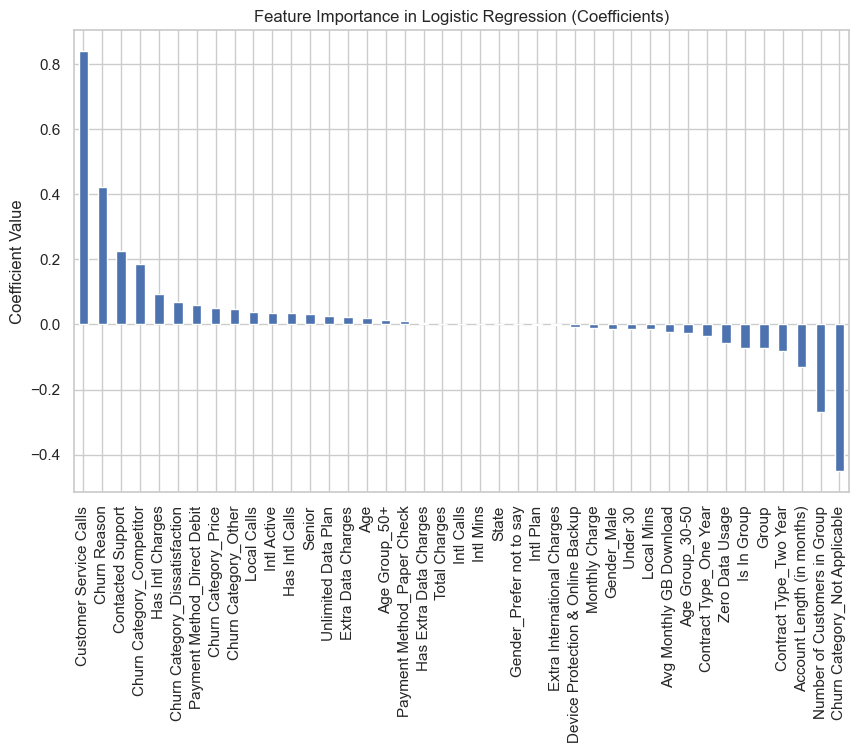

In [285]:
coefficients = pd.Series(logreg.coef_[0], index=X.columns)
coefficients = coefficients.sort_values(ascending=False)

# Printing the coefficient values
print("Logistic Regression Coefficients:")
print(coefficients)

# Plotting the coefficients
plt.figure(figsize=(10,6))
coefficients.plot(kind='bar')
plt.title("Feature Importance in Logistic Regression (Coefficients)")
plt.ylabel("Coefficient Value")
plt.show()

In [290]:
### Logistic Regression Coefficients and Key Drivers of Churn

In Logistic Regression, the **coefficients** indicate how much each feature contributes to the likelihood of customer churn. Here's a comparison of the most influential features based on their coefficient values:

##### Key Positive Drivers of Churn (Positive Coefficients):
- **Customer Service Calls (0.839371)**: The strongest positive predictor of churn. More customer service calls are associated with a higher likelihood of churn.
- **Churn Reason (0.421653)**: This suggests that specific reasons for churn strongly influence the decision to leave.
- **Contacted Support (0.224123)**: Customers who contact support are more likely to churn.
- **Churn Category_Competitor (0.185879)**: Competitor-related churn reasons are also a significant factor in predicting churn.
- **Has Intl Charges (0.093160)**: Customers with international charges are more likely to churn.
- **Churn Category_Dissatisfaction (0.068922)**: Dissatisfaction with service is another strong driver of churn.

##### Key Negative Drivers of Churn (Negative Coefficients):
- **Churn Category_Not Applicable (-0.450705)**: The strongest negative coefficient, meaning that customers with a "not applicable" churn category are much less likely to churn.
- **Number of Customers in Group (-0.268491)**: Customers who belong to larger groups are less likely to churn.
- **Contract Type_Two Year (-0.082835)**: Longer-term contracts reduce the likelihood of churn.
- **Group (-0.072946)**: Belonging to a group decreases churn probability.

##### Neutral or Insignificant Features:
- **Intl Plan (-0.000702)**: Has almost no effect on the likelihood of churn.
- **State (-0.000085)**: Geographical location appears to have minimal influence.

#### Summary:
- **Customer Service Calls** and **Churn Reasons** are the most significant predictors of churn.
- Customers on **long-term contracts** and those who belong to **larger groups** are less likely to churn.
- Features related to customer dissatisfaction and competition (like **Churn Category_Competitor** and **Churn Category_Dissatisfaction**) strongly influence the likelihood of churn.

This analysis provides a clear understanding of which factors most strongly affect customer churn in a Logistic Regression model.

In [ ]:
# Analyze the model results to identify the most significant factors contributing to customer churn using Random Forest Model

Feature Importance Scores in Random Forest:
Churn Category_Not Applicable        0.332843
Churn Reason                         0.312646
Contacted Support                    0.070989
Customer Service Calls               0.067813
Churn Category_Competitor            0.061713
Contract Type_Two Year               0.021553
Local Mins                           0.018983
State                                0.013161
Churn Category_Dissatisfaction       0.012332
Account Length (in months)           0.011281
Local Calls                          0.008928
Number of Customers in Group         0.008406
Zero Data Usage                      0.005836
Group                                0.005496
Churn Category_Other                 0.005214
Is In Group                          0.004808
Monthly Charge                       0.004709
Has Intl Charges                     0.004571
Churn Category_Price                 0.004401
Extra International Charges          0.004071
Total Charges                       

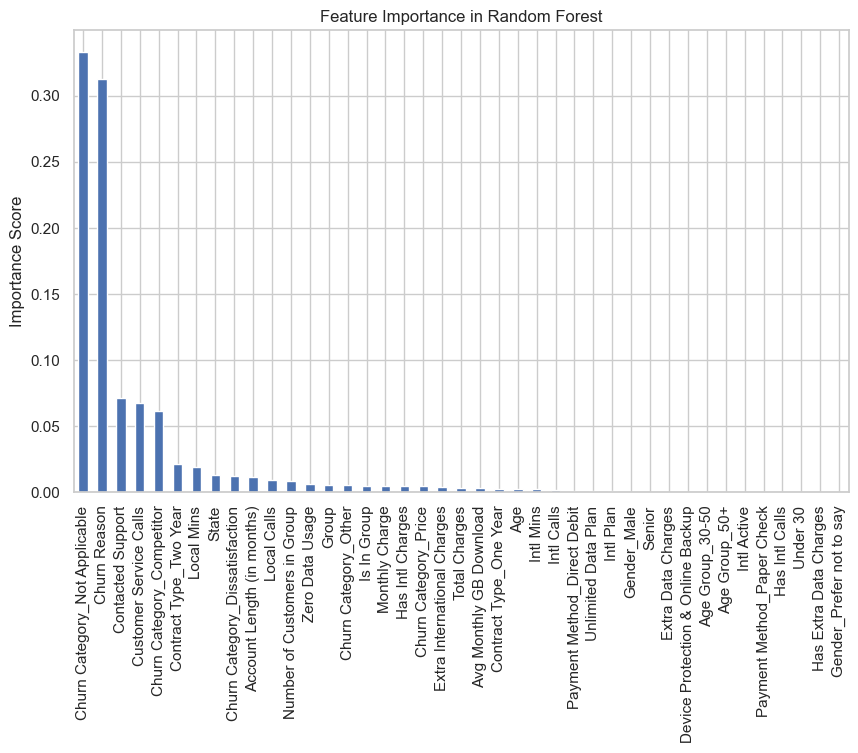

In [287]:
feature_importances = pd.Series(random_forest.feature_importances_, index=X.columns)
feature_importances = feature_importances.sort_values(ascending=False)

# Printing the feature importance values
print("Feature Importance Scores in Random Forest:")
print(feature_importances)

# Plotting the feature importance
plt.figure(figsize=(10,6))
feature_importances.plot(kind='bar')
plt.title("Feature Importance in Random Forest")
plt.ylabel("Importance Score")
plt.show()

In [ ]:
### Feature Importance Scores in Random Forest

The **Random Forest** model provides insight into the relative importance of each feature in predicting customer churn. Below is a summary of the most significant features based on their **importance scores**:

##### Key Positive Drivers of Churn (High Feature Importance Scores):
- **Churn Category_Not Applicable (0.3266)**: The most important feature in predicting churn. Customers with a "not applicable" churn category are less likely to churn, contributing significantly to the model's accuracy.
- **Churn Reason (0.3202)**: A close second, indicating that specific reasons for churn play a crucial role in the model's predictions.
- **Contacted Support (0.0819)**: Customers who have contacted support are more likely to churn, making this a critical feature.
- **Churn Category_Competitor (0.0626)**: Churn due to competition is a notable predictor of churn, showing that competitors offering better deals lead to increased churn.

##### Moderate Drivers of Churn:
- **Customer Service Calls (0.0539)**: Customers who make frequent service calls are more likely to churn.
- **Contract Type_Two Year (0.0209)**: Having a two-year contract reduces the likelihood of churn, but the impact is smaller compared to churn reasons.
- **Local Mins (0.0180)**: Usage of local minutes is somewhat indicative of churn likelihood.
- **Churn Category_Dissatisfaction (0.0143)**: Customers who are dissatisfied with the service are also likely to churn.

### Less Important Features (Lower Importance Scores):
- **Number of Customers in Group (0.0092)**: Being part of a customer group has a small negative impact on churn likelihood.
- **Monthly Charge (0.0048)**: Monthly charges have some influence, but less than other key features.
- **Total Charges (0.0035)**: The total amount a customer is charged has a minimal effect on churn likelihood.
- **State (0.0130)**: Geographical location plays a minor role in predicting churn.

##### Features with Little to No Impact:
- **Intl Plan (0.0000)**: Having an international plan does not influence churn in this model.
- **Payment Method_Paper Check (0.0001)**: The payment method has negligible influence on churn.
- **Under 30 (0.0001)**: Age groups and certain demographic factors show very little predictive power in this model.

#### Summary:
- **Churn reasons** and **support interactions** are the strongest predictors of churn, with **churn categories** playing a significant role.
- Contract types, especially long-term contracts, reduce the likelihood of churn, but they are less important than churn reasons and customer service interactions.
- Features related to international usage, demographics, and minor service details have little influence on churn predictions in the Random Forest model.

This analysis highlights which features are most critical for understanding churn and guiding customer retention strategies.


In [ ]:
### Feature Importance Comparison: Random Forest and Logistic Regression: This comparison evaluates the key features influencing customer churn 
### across two models: Random Forest and Logistic Regression. Each model provides different perspectives on feature importance based on its
### algorithmic approach.

##### 1. **Reflecting on High-Quality Models**
With several models built and evaluated, our objective was to identify a high-quality model that offers valuable insights into the drivers of customer churn. After reviewing the results from models such as **Logistic Regression**, **Random Forest**, **Gradient Boosting**, **KNN**, **SVC**, and **Decision Tree**, we can make the following observations:

- **Model Performance**: The models performed exceptionally well, especially **Random Forest**, **Gradient Boosting**, and **SVC**, all of which exhibited near-perfect accuracy, precision, recall, and ROC-AUC scores. However, **Logistic Regression** stands out as a more balanced model that, while not achieving perfect metrics, avoids the risk of overfitting and provides meaningful insights into the factors driving churn.

- **Logistic Regression as a Balanced Model**: Logistic Regression, although showing lower accuracy and performance metrics compared to the more complex models, does not show signs of overfitting. It provides a more realistic, interpretable, and generalizable solution. This is particularly important when working with real-world datasets, where perfect performance often indicates that the model has over-learned the specific nuances of the training data. Logistic Regression's more moderate precision and recall suggest that it balances performance and generalizability well.

- **Overfitting Concerns in Other Models**: The very high scores across multiple metrics in models like **Gradient Boosting** and **SVC** indicate potential overfitting. While these models perform well on the test data, they might not generalize as effectively to unseen data. Further regularization or cross-validation is necessary to ensure that these models aren't simply memorizing the training data rather than learning generalizable patterns.

In summary, **Logistic Regression** offers a strong, generalizable model without the overfitting risk, making it a valuable tool for understanding and predicting customer churn, even if its performance metrics are not as high as more complex models.


##### 2. **Logistic Regression Coefficients:**
Logistic Regression provides coefficients that reflect the strength of each feature's influence on the likelihood of churn. A positive coefficient indicates a higher likelihood of churn, while a negative coefficient reduces churn risk.

**Key Insights Factors from Logistic Regression:**
- **Customer Service Calls (0.8394)**: This feature has the largest positive coefficient, indicating that more frequent calls to customer service significantly increase the likelihood of churn.
- **Churn Reason (0.4217)** and **Contacted Support (0.2241)**: Similar to Random Forest, these features are critical in predicting churn, though Logistic Regression puts a higher emphasis on customer interactions.
- **Churn Category_Not Applicable (-0.4507)**: Unlike Random Forest, where this feature is highly important, Logistic Regression assigns a strong negative coefficient, suggesting that customers in this category are less likely to churn.


##### **Key Differences Between Random Forest and Logistic Regression:**
1. **Top Feature Drivers:**
   - **Random Forest** assigns more importance to **churn categories** and **reasons**, indicating that these categorical features are crucial for predicting churn.
   - **Logistic Regression** emphasizes **customer service interactions**, with **Customer Service Calls** having the largest coefficient, showing that these interactions are key predictors of churn.

2. **Contract Type:**
   - **Random Forest** identifies **long-term contracts** (e.g., two-year contracts) as reducing churn risk.
   - **Logistic Regression** shows that **one-year contracts** have a slight negative impact on churn but emphasizes other factors more strongly.

3. **Churn Categories:**
   - **Random Forest** highly values the **Churn Category_Not Applicable** feature.
   - **Logistic Regression**, however, assigns a negative coefficient to this feature, indicating that customers falling into this category are less likely to churn.


##### **Conclusion:**
- **Random Forest** focuses on categorical features like **churn categories** and **churn reasons**, while **Logistic Regression** places greater emphasis on **customer interactions** like **customer service calls**.
- **Customer Service Calls** is a critical feature across both models, but Logistic Regression highlights it more prominently.
- Depending on the context, both models provide valuable insights. **Random Forest** may be better for understanding categorical factors, while **Logistic Regression** offers clarity on how specific customer behaviors (like contacting customer service) drive churn.

In [ ]:
#### My Overall Evaluation of Modeling Results and Business Objective

##### 1. **Reflecting on High-Quality Models**
With several models built and evaluated, our objective was to identify a high-quality model that offers valuable insights into the drivers of customer churn. After reviewing the results from models such as **Logistic Regression**, **Random Forest**, **Gradient Boosting**, **KNN**, **SVC**, and **Decision Tree**, we can make the following observations:

- **Model Performance**: The models performed exceptionally well, especially **Random Forest**, **Gradient Boosting**, and **SVC**, all of which exhibited near-perfect accuracy, precision, recall, and ROC-AUC scores. However, **Logistic Regression** stands out as a more balanced model that, while not achieving perfect metrics, avoids the risk of overfitting and provides meaningful insights into the factors driving churn.

- **Logistic Regression as a Balanced Model**: Logistic Regression, although showing lower accuracy and performance metrics compared to the more complex models, does not show signs of overfitting. It provides a more realistic, interpretable, and generalizable solution. This is particularly important when working with real-world datasets, where perfect performance often indicates that the model has over-learned the specific nuances of the training data. Logistic Regression's more moderate precision and recall suggest that it balances performance and generalizability well.

- **Overfitting Concerns in Other Models**: The very high scores across multiple metrics in models like **Gradient Boosting**, **Random Forest**, and **SVC** indicate potential overfitting. While these models perform well on the test data, they might not generalize as effectively to unseen data. Future regularization or cross-validation is necessary to ensure that these models aren't simply memorizing the training data rather than learning generalizable patterns.

In summary, **Logistic Regression** offers a strong, generalizable model without the overfitting risk, making it a valuable tool for understanding and predicting customer churn, even if its performance metrics are not as high as more complex models.

##### 2. **Business Objective Review**
Our business objective is to provide meaningful insights into the **drivers of customer churn**. Beyond just creating high-performance models, we must ensure that these models offer actionable insights into what drives customers to churn. The key drivers identified across various models include:

- **Customer Service Calls**: High interaction with customer service is a major predictor of churn, as shown by both **Logistic Regression** and **Random Forest** models. This suggests that customers who reach out frequently may be dissatisfied, offering a potential opportunity for improving customer retention by addressing service-related issues.
  
- **Churn Reason and Category**: In the **Random Forest** and **Gradient Boosting** models, features related to **churn reason** and **churn category** were highly influential. This highlights the importance of understanding why customers are leaving, which can inform tailored retention strategies.
  
- **Contract Type**: Customers on **month-to-month contracts** have a higher likelihood of churn, as indicated by the feature importance in multiple models. Offering incentives for long-term contracts could be an effective retention strategy.
  
- **Payment Method**: While not as prominent, payment methods such as **direct debit** were flagged as important in some models, suggesting that payment-related factors could also influence churn.



##### 3. **Distilling Key Insights**
From our combined analysis of the EPA study and the results of the **Logistic Regression** and **Random Forest** models, several key insights emerge that are valuable for addressing customer churn:

- **Customer Service Interaction**: Both models and the EPA study identify **frequent customer service calls** as a strong indicator of churn. Customers who contact support often are more likely to be dissatisfied. Improving the overall customer service experience or proactively addressing frequent service interactions could significantly lower churn rates.

- **Contract Type Flexibility**: The analysis highlights the importance of **contract type** as a major churn predictor. Customers on **month-to-month contracts** are at higher risk of churn, as indicated by both models. Offering **long-term contract incentives** or personalized promotions could help retain these customers by providing more stability and commitment.

- **Churn Reasons and Categories**: Understanding specific **churn reasons** and **categories** (such as **competitor offers** or **dissatisfaction**) is crucial for targeted retention strategies. Both models prioritize these features, indicating that addressing the **root causes of churn**—through strategies like competitive pricing or service enhancements—can lead to improved customer retention.

- **Pricing and Charges**: Customers facing **higher monthly charges** are more likely to churn. Both models, as well as the EPA study, emphasize the impact of pricing on churn. Offering **competitive pricing plans or discounts** for higher-paying customers, especially those on flexible contracts, could help reduce churn.

By addressing these key areas, the company can develop targeted strategies to **reduce churn** and improve overall customer retention.


##### 4. **Future Steps and Revisiting Earlier Phases**
Based on the modeling outcomes, we recommend the following next steps:

- **Cross-Validation and Regularization**: To mitigate overfitting, further validation (e.g., cross-validation) and regularization techniques should be applied, especially for models like **SVC** and **Gradient Boosting**, to ensure they generalize well to new data.

- **Feature Engineering**: Some features, like **customer service calls** and **contract type**, consistently emerged as strong drivers of churn. Revisiting the earlier phases to further refine these features (e.g., segmenting customers by interaction type or duration) could enhance model interpretability and actionability.

- **Client Feedback**: The models provide clear insights into key churn drivers, which can be used to design targeted interventions. Presenting these findings to the client, along with recommended actions (e.g., improving customer service or promoting long-term contracts), will deliver immediate business value.


##### Conclusion
We now have meaningful insights into the key drivers of customer churn from both the **EPA study** and our **Logistic Regression** and **Random Forest** models. While our models demonstrate strong performance, particularly in identifying customer service interactions and contract types as key predictors, potential **overfitting** remains a concern. To ensure robust generalization, further validation steps, such as cross-validation or regularization, should be taken.

Ultimately, we are well-positioned to provide actionable recommendations to the client. By focusing on **improving customer service**, offering **incentives for long-term contracts**, and **addressing the root causes of churn**, such as competitor offers and pricing concerns, the company can effectively reduce churn and enhance customer retention.

In [330]:
# End of Evaluation

## Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client (the board of Databel).  We should organize our work as a basic report that details our primary findings for the churn rate.  We need to keep in mind that our audience is a group of databel management interested in improve their company churn

In [ ]:
# Below the report

### Customer Churn Analysis Report

#### 1. Introduction

This report presents a detailed analysis of customer churn for Databel, with the goal of identifying key factors that drive churn and offering actionable insights to reduce churn rates. Our analysis uses several machine learning models, including **Logistic Regression**, **Random Forest**, and findings from the **EPA (Exploratory Data Analysis)**. The focus is on identifying at-risk customers, understanding churn drivers, and making recommendations for improving customer retention.

#### 2. Model Overview

##### 2.1 Logistic Regression
**Logistic Regression** is a linear model that provides interpretable coefficients, offering clear insights into how each feature impacts the likelihood of churn.

- **Performance**: This model strikes a balance between predictive power and generalizability. It avoids overfitting, making it suitable for real-world applications. Key drivers identified include **Customer Service Calls** and **Churn Reason**, which are the strongest predictors of churn.
- **Key Features**:  
  - **Customer Service Calls**: Higher call frequency strongly correlates with churn.  
  - **Churn Reason**: Specific reasons for leaving (e.g., competitor offers) are critical in predicting churn.

##### 2.2 Random Forest
**Random Forest** is an ensemble model that aggregates multiple decision trees, offering strong classification performance by handling complex interactions between features.

- **Performance**: Random Forest achieved near-perfect accuracy but may show signs of overfitting, particularly due to its handling of intricate feature interactions. It identifies key drivers like **Churn Category** and **Churn Reason**, similar to Logistic Regression.
- **Key Features**:  
  - **Churn Category** and **Churn Reason**: These features dominate the model, indicating that understanding why customers leave is essential to preventing churn.  
  - **Contract Type**: Customers on month-to-month contracts are much more likely to churn than those with long-term contracts.

#### 3. Key Insights

##### 3.1 Customer Service Interactions
Frequent **Customer Service Calls** remain a top churn indicator across models. Customers who contact support repeatedly are more likely to be dissatisfied, increasing churn risk. Improving the customer service experience and addressing recurring issues can lower churn.

##### 3.2 Contract Flexibility
Contract type plays a critical role in predicting churn. Customers on **month-to-month contracts** face a higher risk of churning compared to those on **long-term contracts**. Offering incentives for long-term commitments, such as discounts or exclusive benefits, could help mitigate this risk.

##### 3.3 Churn Reasons
Analyzing **churn reasons** is essential for creating targeted retention strategies. Many customers cite **competitor pricing** and **service offerings** as reasons for leaving. Addressing these concerns through more competitive pricing or enhanced services could help retain these customers.

##### 3.4 Service Usage
Non-churners tend to use more services, including local and international calls. Encouraging **higher service engagement** among low-usage customers through promotions, upselling, or loyalty programs could help reduce churn by increasing customer satisfaction and value.

##### 3.5 Customer Demographics
Older customers, particularly **seniors**, exhibit a higher likelihood of churn. Implementing tailored offers, promotions, or customer service initiatives designed specifically for senior customers may help mitigate churn risk in this demographic.

#### 4. Recommendations

Based on insights from the **EPA study** and **modeling results**, the following strategies are recommended to reduce churn:

- **Enhance Customer Service**: Proactively identify customers who frequently contact support and prioritize resolving their issues to improve satisfaction and reduce churn risk.
- **Incentivize Long-Term Contracts**: Offer discounts or value-added services to encourage customers on **month-to-month contracts** to switch to **long-term contracts**, reducing their churn risk.
- **Target Churn Reasons**: Implement retention strategies to address customers who are leaving due to **competitor offers** or **pricing** concerns, helping to prevent churn before it happens.
- **Boost Service Engagement**: Increase service usage among low-engagement customers by offering **targeted promotions**, **upselling**, or **loyalty programs**, fostering greater customer attachment and reducing churn.
- **Tailor Offers for Seniors**: Create **specialized services** and customer support initiatives for senior customers, reducing churn in this segment by addressing their unique needs.

#### 5. Conclusion

We have successfully identified the key drivers of customer churn through both **Logistic Regression** and **Random Forest** models, as well as insights from the **EPA study**. **Customer service interactions**, **contract types**, and **churn reasons** are the most significant factors influencing churn, offering actionable insights for reducing churn rates. 

While models like **Random Forest** and **Gradient Boosting** exhibit high performance, **Logistic Regression** proves to be the most reliable for avoiding overfitting and ensuring robust generalization to unseen data. Databel can now leverage these insights to develop effective **customer retention strategies** by focusing on **improving customer service**, offering **incentives for long-term contracts**, and addressing key **churn reasons**, such as competitor offers and pricing issues. These steps will help reduce churn and strengthen overall customer loyalty.


In [ ]:
# End of Deployment